In [1]:
import sys
sys.path.insert(0, '../../stock_factor_lab/')

# 台股實驗彙總

## 回測期間設定

In [2]:
START_DATE = '2003-3-31'
END_DATE = '2024-12-31'

## 前置作業

### import

In [3]:
from get_data import Data
import backtest
from combinations import sim_conditions

import random
import talib
import pandas as pd
import numpy as np
from datetime import datetime
from dateutil.relativedelta import relativedelta
import itertools

import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
from itertools import cycle
from plotly.subplots import make_subplots
import matplotlib as mpl
from matplotlib.ticker import FuncFormatter
import matplotlib.dates as mdates
import seaborn as sns
import re

from matplotlib import rcParams
rcParams['font.sans-serif'] = ['Microsoft JhengHei']
mpl.rcParams['axes.unicode_minus'] = False

from dataframe import CustomDataFrame

### get data

In [4]:
data=Data()

## 資料下載

In [5]:
profit = data.get('annual_report_fundamentals:常續性稅後淨利')
income_bf_tax = data.get('annual_report_fundamentals:稅前淨利')

long_term_items = [
    '透過損益按公允價值衡量之金融資產－非流動', #2005
    '透過其他綜合損益按公允價值衡量之金融資產－非流動', #2005
    '按攤銷後成本衡量之金融資產－非流動', #2005
    '避險之金融資產－非流動', #2005
    '合約資產－非流動', #2017
    '採權益法之長期股權投資',
    '預付投資款', #2005
    '投資性不動產淨額'
]
# 長期投資項目 (8個)
long_term_data = [data.get(f'annual_report_fundamentals:{item}').fillna(0) for item in long_term_items]
long_term_investment = sum(long_term_data)
# 固定資產
fixed_assets_year = data.get('annual_report_fundamentals:不動產廠房及設備').fillna(0)
# 計算盈再率分子
long_term_investment_df = (long_term_investment - long_term_investment.shift(4))
fixed_assets_df = (fixed_assets_year - fixed_assets_year.shift(4))
# 分母
profit_rol_df = profit.rolling(4).sum()

# 計算出盈再率
# 去掉淨利為負的公司 (當年度淨利為負、四年加總淨利為負都去掉)
# 因為2005年之前財報有改制，所以在這之前用非流動資產來算分子，但其實好像跟全部用改制後的方法來算差不多（洪瑞泰盈再表的分子項目沒有包含所有長期投資項）
orig_rr = (long_term_investment_df + fixed_assets_df) / profit_rol_df
orig_rr = orig_rr[(profit > 0) & (profit_rol_df > 0)]['2009':]

rr_sum = data.get('annual_report_fundamentals:非流動資產')
rr_sum_df = rr_sum - rr_sum.shift(4)

old_rr = rr_sum_df / profit_rol_df
old_rr = old_rr[(profit > 0) & (profit_rol_df > 0)][:'2008']

common_columns = sorted(list(set(orig_rr.columns) & set(old_rr.columns)))
# 合併資料
rr = pd.concat([old_rr[common_columns], orig_rr[common_columns]])

pe = data.get('quarter_report:PE')
daily_pe = data.get('price:daily_pe')

roe = data.get('annual_report:ROE')

payout_ratio = data.get('annual_report_fundamentals:股利支付率')

stock_hold = data.get('annual_report_fundamentals:董監持股%')

close = data.get('price:close')

comp_profile = data.get('company_profile')
list_stock_data = {}
for index, row in comp_profile.iterrows():
    stock_code = row['company_symbol']
    listed_date = row['ipo_date']
    end_date = listed_date + pd.DateOffset(years=2)
    
    # 創建一個全為 True 的 series
    series = pd.Series(True, index=close.index)
    # 在上市日之前和之後兩年內設置為 False
    series.loc[:end_date] = False
    list_stock_data[stock_code] = series

listed = pd.concat(list_stock_data, axis=1)
listed = CustomDataFrame(listed)

## 原始條件

In [6]:
roe_rol = roe.rolling(5).mean()
roe_15 = roe_rol > 15

rr_cond = rr < 0.4

payout_ratio_cond = (payout_ratio.rolling(3).min() >= 40)

profit_cond = profit > 500000 # TEJ 的淨利單位是千元

hold_cond = stock_hold > 10

listed = listed.resample('ME').last()

# 每季本益比
pe_entry = pe < 12
pe_exit = pe > 30

# 每月本益比
# 每日本益比resample成每月
daily_pe_resample = daily_pe.resample('ME').last()

pe_cond_entry_daily = daily_pe_resample < 12
pe_cond_exit_daily = daily_pe_resample > 30

### 台股各選股原則滿足條件的公司比例

In [7]:
stock_data = {}
for index, row in comp_profile.iterrows():
    stock_code = row['company_symbol']
    listed_date = row['ipo_date']
    
    # 創建一個全為 True 的 series
    series = pd.Series(True, index=close.index)

    series.loc[:listed_date] = False
    stock_data[stock_code] = series

listed_comp_df = pd.concat(stock_data, axis=1)

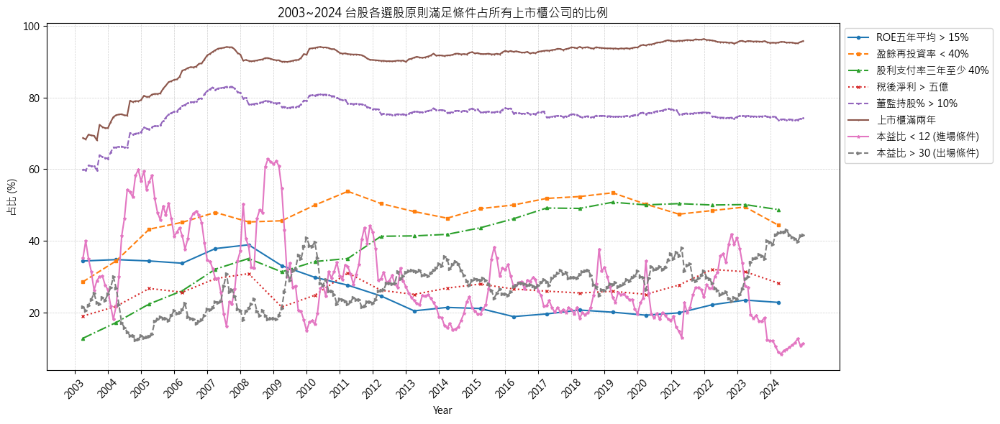

In [8]:
plt.figure(figsize=(14, 6))

# 準備資料
roe_data = (roe_15[START_DATE:END_DATE].sum(axis=1) / listed_comp_df[START_DATE:END_DATE].sum(axis=1).resample('YE-MAR').last()) * 100
rr_data = (rr_cond[START_DATE:END_DATE].sum(axis=1) / listed_comp_df[START_DATE:END_DATE].sum(axis=1).resample('YE-MAR').last()) * 100
payout_data = (payout_ratio_cond[START_DATE:END_DATE].sum(axis=1) / listed_comp_df[START_DATE:END_DATE].sum(axis=1).resample('YE-MAR').last()) * 100
profit_data = (profit_cond[START_DATE:END_DATE].sum(axis=1) / listed_comp_df[START_DATE:END_DATE].sum(axis=1).resample('YE-MAR').last()) * 100
# common_columns = hold_cond.columns.intersection(payout_ratio_cond.columns)
hold_cond_data = ((hold_cond & listed)[START_DATE:END_DATE].sum(axis=1) / listed_comp_df[START_DATE:END_DATE].sum(axis=1).resample('ME').last()) * 100
listed_data = (listed[START_DATE:END_DATE].sum(axis=1) / listed_comp_df[START_DATE:END_DATE].sum(axis=1).resample('ME').last()) * 100
pe_cond_entry_data = (pe_cond_entry_daily[START_DATE:END_DATE].sum(axis=1) / listed_comp_df[START_DATE:END_DATE].sum(axis=1).resample('ME').last()) * 100
pe_cond_exit_data = (pe_cond_exit_daily[START_DATE:END_DATE].sum(axis=1) / listed_comp_df[START_DATE:END_DATE].sum(axis=1).resample('ME').last()) * 100

# 繪製折線圖
plt.plot(roe_data.index, roe_data, marker='o', linestyle='-', markersize=3, label='ROE五年平均 > 15%')
plt.plot(rr_data.index, rr_data, marker='s', linestyle='--', markersize=3, label='盈餘再投資率 < 40%')
plt.plot(payout_data.index, payout_data, marker='^', linestyle='-.', markersize=3, label='股利支付率三年至少 40%')
plt.plot(profit_data.index, profit_data, marker='x', linestyle=':', markersize=3, label='稅後淨利 > 五億')
plt.plot(hold_cond_data.index, hold_cond_data, marker='D', linestyle='--', markersize=1, label='董監持股% > 10%')
plt.plot(listed_data.index, listed_data, marker='|', linestyle='-', markersize=1, label='上市櫃滿兩年')
plt.plot(pe_cond_entry_data.index, pe_cond_entry_data, marker='*', linestyle='-', markersize=3, label='本益比 < 12 (進場條件)')
plt.plot(pe_cond_exit_data.index, pe_cond_exit_data, marker='>', linestyle='--', markersize=3, label='本益比 > 30 (出場條件)')

# 設置 X 軸為每年年份
plt.xlabel("Year")
plt.ylabel("占比 (%)")
plt.title("2003~2024 台股各選股原則滿足條件占所有上市櫃公司的比例")
plt.grid(True)
plt.xticks(
    ticks=pd.date_range(start="2003-01-01", end="2024-12-31", freq="YS"),
    labels=pd.date_range(start="2003-01-01", end="2024-12-31", freq="YS").strftime("%Y"),
    rotation=45
)

plt.grid(linestyle='--', linewidth=0.5, alpha=0.6)
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))  # 將圖例移動到圖表右上角外
plt.tight_layout()
plt.show()

---

## 回測

In [9]:
orig_all_cond = (roe_15 & rr_cond & payout_ratio_cond & profit_cond & hold_cond & listed)[START_DATE:END_DATE]
orig_all_cond_and_pe = ((orig_all_cond & pe_entry[START_DATE:END_DATE]).hold_until((~orig_all_cond) | pe_exit[START_DATE:END_DATE]))
orig_all_cond_and_pe_daily = ((orig_all_cond & pe_cond_entry_daily[START_DATE:END_DATE]).hold_until((~orig_all_cond) | pe_cond_exit_daily[START_DATE:END_DATE]))

In [10]:
rep_all_cond_dic = {}

rep_all_cond_dic['台股_原始條件_不含本益比進出場'] = orig_all_cond
# rep_all_cond_dic['台股_原始條件_每季本益比進出場'] = orig_all_cond_and_pe
rep_all_cond_dic['台股_原始條件_每月月底本益比進出場'] = orig_all_cond_and_pe_daily

In [11]:
rep_all_cond = sim_conditions(rep_all_cond_dic, resample='ME', data=data)

Backtesting progress: 100%|██████████| 2/2 [00:05<00:00,  2.66s/condition]


In [12]:
# rep_all_cond.plot_creturns()

In [13]:
# rep_all_cond.plot_stats()

In [14]:
rep_all_cond.selected_stock_count_analysis()

,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
台股_原始條件_每月月底本益比進出場,13.21,-55.38,35.48,36.0,29.25,43.00,2.0,63.0
台股_原始條件_不含本益比進出場,12.22,-54.84,56.11,58.0,52.00,72.75,3.0,100.0


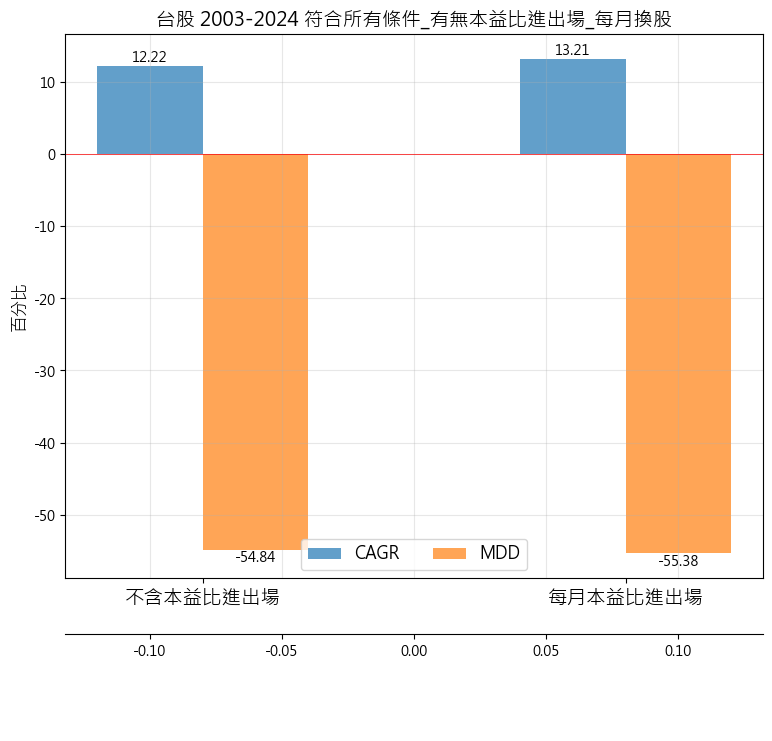

In [57]:
rep_all_cond_df = rep_all_cond.selected_stock_count_analysis()
rep_all_cond_df = rep_all_cond_df.reset_index()

# 分組資料
no_pe = rep_all_cond_df[rep_all_cond_df['Strategy'].str.contains('不含本益比進出場')]
monthly_pe = rep_all_cond_df[rep_all_cond_df['Strategy'].str.contains('月底本益比進出場')]

# 提取x軸標籤
no_pe_labels = [s.split('_')[1:2] for s in no_pe['Strategy']]
no_pe_labels = ['_'.join(label) for label in no_pe_labels]

# 設置圖表
plt.figure(figsize=(9, 8))
width = 0.04  # bar的寬度
group_padding = 0.1  # 不同組之間的間距

# 設置x軸位置
x = range(len(no_pe_labels))

# 繪製bars
bars1 = plt.bar([i - group_padding for i in x], no_pe['CAGR (%)'], width, label='CAGR', color='tab:blue', alpha=0.7)
bars2 = plt.bar([i - group_padding + width for i in x], no_pe['MDD (%)'], width, label='MDD', color='tab:orange', alpha=0.7)
bars3 = plt.bar([i + group_padding - width for i in x], monthly_pe['CAGR (%)'], width, color='tab:blue', alpha=0.7)
bars4 = plt.bar([i + group_padding for i in x], monthly_pe['MDD (%)'], width, color='tab:orange', alpha=0.7)

# 添加數值標籤
for bar in bars1 + bars2 + bars3 + bars4:
    height = bar.get_height()
    if height > 0:
        plt.text(bar.get_x() + bar.get_width() / 2, height, f'{height:.2f}', ha='center', va='bottom', fontsize=10)
    else:
        plt.text(bar.get_x() + bar.get_width() / 2, height, f'{height:.2f}', ha='center', va='top', fontsize=10)

# 獲取軸對象
ax = plt.gca()

# 設置Y軸刻度，以10為間隔
ax.yaxis.set_major_locator(plt.MultipleLocator(10))

# 設置網格線
plt.grid(True, alpha=0.3, which='both', axis='both')

# 添加次要x軸標籤（本益比條件）
ax2 = ax.secondary_xaxis('bottom') 
# 調整標籤位置，使其對齊對應的柱狀圖組
ax2.set_xticks([i - group_padding + width/2 for i in x] + [i + group_padding - width/2 for i in x])
ax2.set_xticklabels(['不含本益比進出場']*len(no_pe_labels) + ['每月本益比進出場']*len(no_pe_labels), fontsize=14)

# 移動主要x軸到次要x軸的下方
ax.xaxis.set_label_position('bottom')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('outward', 40))

# 設置圖表外觀
ax.set_xlabel(' ', labelpad=40)  # 增加labelpad使標籤遠離軸

plt.ylabel('百分比', fontsize=12)
plt.title('台股 2003-2024 符合所有條件_有無本益比進出場_每月換股', fontsize=14)
plt.legend(['CAGR', 'MDD'], loc='lower center', ncol=2, fontsize=12)
plt.axhline(0, color='red', linewidth=0.5)

# 調整版面配置
plt.subplots_adjust(bottom=0.2)  # 增加底部空間以容納標籤

# 顯示圖表
plt.show()

In [16]:
# # 入選股數占比平均%
# rep_all_cond.selected_stock_count_analysis(ratio=True)

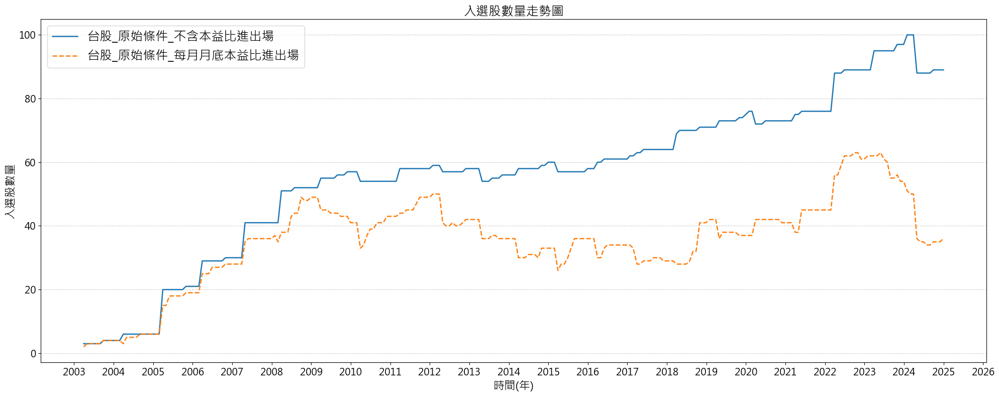

In [17]:
rep_all_cond.plot_reps_stock_counts()

In [18]:
rep_all_cond.holding_period_analysis()

,CAGR (%),MDD (%),持有期間平均,25%,中位數,75%,最大值,最小值
Strategy,,,,,,,,
台股_原始條件_每月月底本益比進出場,13.21,-55.38,978.722222,365.0,674.0,1370.00,5356.0,90.0
台股_原始條件_不含本益比進出場,12.22,-54.84,1140.369231,369.0,731.0,1460.75,7945.0,58.0


In [19]:
# orig_pe_rep_period_df = rep_all_cond.reports['台股_原始條件_每月月底本益比進出場'].trades
# orig_pe_rep_period_df = orig_pe_rep_period_df.reset_index(inplace=False).sort_values(by='period', ascending=False, inplace=False)
# orig_pe_rep_period_df.head(20)

In [20]:
# orig_rep_period_df = rep_all_cond.reports['台股_原始條件_不含本益比進出場'].trades
# orig_rep_period_df = orig_rep_period_df.reset_index(inplace=False).sort_values(by='period', ascending=False, inplace=False)
# orig_rep_period_df.head(20)

---

In [21]:
rep_all_cond.reports['台股_原始條件_每月月底本益比進出場'].display()

,annualized_rate_of_return,sharpe,max_drawdown,win_ratio
,13.21%,22.68,-55.38%,61.66%


,entry_date,exit_date,entry_sig_date,exit_sig_date,position,period,entry_index,exit_index,return,mae,gmfe,bmfe,mdd,pdays,weight,next_weights
stock_id,,,,,,,,,,,,,,,,
1232,2010-05-03,NaT,2010-04-30,NaT,0.029412,3603.0,2582.0,-1.0,6.765965,-0.037802,7.300510,0.000000,-0.286155,3565.0,0.028571,0.027778
1436,2024-05-02,NaT,2024-04-30,NaT,0.027778,166.0,6019.0,-1.0,-0.060440,-0.114867,0.402867,0.108105,-0.366848,97.0,0.028571,0.027778
1537,2013-05-02,NaT,2013-04-30,NaT,0.027778,2857.0,3328.0,-1.0,3.848656,-0.017000,4.120721,0.000000,-0.299662,2853.0,0.028571,0.027778
1580,2024-08-01,NaT,2024-07-31,NaT,0.029412,104.0,6081.0,-1.0,-0.012584,-0.053872,0.050505,0.000000,-0.083333,29.0,0.028571,0.027778
2020,2024-05-02,NaT,2024-04-30,NaT,0.027778,166.0,6019.0,-1.0,-0.118001,-0.150202,0.046422,0.046422,-0.187901,24.0,0.028571,0.027778
2373,2018-04-02,NaT,2018-03-31,NaT,0.035714,1647.0,4538.0,-1.0,0.084896,-0.034444,0.343983,0.000000,-0.211970,1617.0,0.028571,0.027778
2377,2019-05-02,NaT,2019-04-30,NaT,0.027778,1384.0,4801.0,-1.0,1.891273,-0.117647,2.121393,0.003530,-0.457523,1338.0,0.028571,0.027778
2385,2019-06-03,NaT,2019-05-31,NaT,0.026316,1362.0,4823.0,-1.0,1.922306,-0.043194,3.779579,0.366465,-0.423636,1358.0,0.028571,0.027778
2420,2022-04-01,NaT,2022-03-31,NaT,0.017857,671.0,5514.0,-1.0,0.823116,-0.078794,1.209302,0.011589,-0.222785,506.0,0.028571,0.027778


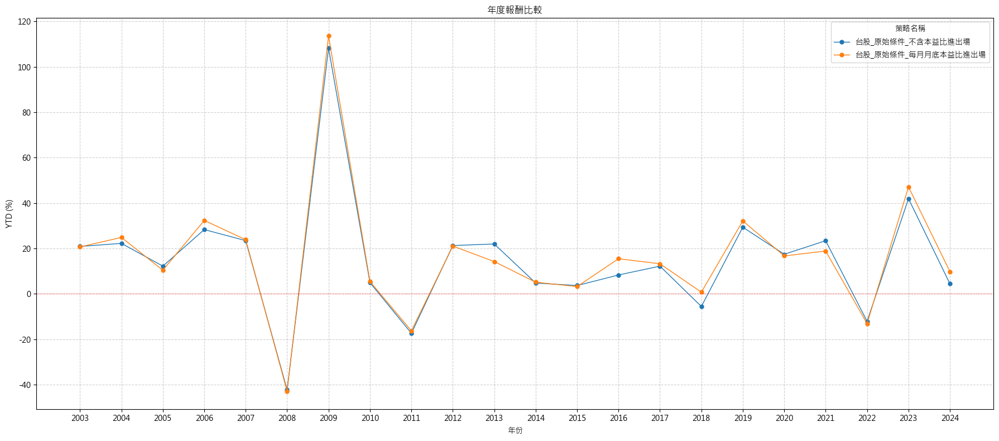

In [22]:
rep_all_cond.visualize_ytd_performance()

In [23]:
# _,_=rep_all_cond.reports['台股_原始條件_不含本益比進出場'].calc_returns_contrib(5)

In [24]:
orig_pe_pos_ret, orig_pe_neg_ret =rep_all_cond.reports['台股_原始條件_每月月底本益比進出場'].calc_returns_contrib(5)

In [25]:
# orig_pe_pos_ret

In [26]:
# orig_pe_neg_ret

### 切分時間段2003~2009、2009~2024

In [27]:
orig_all_cond_2003_2009 = (roe_15 & rr_cond & payout_ratio_cond & profit_cond & hold_cond & listed)[START_DATE:'2009-3-31']
orig_all_cond_2009_2024 = (roe_15 & rr_cond & payout_ratio_cond & profit_cond & hold_cond & listed)['2009-3-31':END_DATE]

# orig_all_cond_and_pe_2003_2009 = ((orig_all_cond_2003_2009 & pe_entry[START_DATE:'2009-3-31']).hold_until((~orig_all_cond_2003_2009) | pe_exit[START_DATE:'2009-3-31']))
# orig_all_cond_and_pe_2009_2024 = ((orig_all_cond_2009_2024 & pe_entry['2009-3-31':END_DATE]).hold_until((~orig_all_cond_2009_2024) | pe_exit['2009-3-31':END_DATE]))

orig_all_cond_and_pe_daily_2003_2009 = ((orig_all_cond_2003_2009 & pe_cond_entry_daily[START_DATE:'2009-3-31']).hold_until((~orig_all_cond_2003_2009) | pe_cond_exit_daily[START_DATE:'2009-3-31']))
orig_all_cond_and_pe_daily_2009_2024 = ((orig_all_cond_2009_2024 & pe_cond_entry_daily['2009-3-31':END_DATE]).hold_until((~orig_all_cond_2009_2024) | pe_cond_exit_daily['2009-3-31':END_DATE]))

In [28]:
time_period_dic = {}

time_period_dic['台股_原始條件_不含本益比進出場_2003-2009'] = orig_all_cond_2003_2009
time_period_dic['台股_原始條件_不含本益比進出場_2009-2024'] = orig_all_cond_2009_2024


# time_period_dic['台股_原始條件_每季本益比進出場_2003-2009'] = orig_all_cond_and_pe_2003_2009
# time_period_dic['台股_原始條件_每季本益比進出場_2009-2024'] = orig_all_cond_and_pe_2009_2024

time_period_dic['台股_原始條件_每月月底本益比進出場_2003-2009'] = orig_all_cond_and_pe_daily_2003_2009
time_period_dic['台股_原始條件_每月月底本益比進出場_2009-2024'] = orig_all_cond_and_pe_daily_2009_2024

time_period_rep_collec = sim_conditions(time_period_dic, resample="ME", data=data)

Backtesting progress: 100%|██████████| 4/4 [00:09<00:00,  2.26s/condition]


In [29]:
# time_period_rep_collec.plot_creturns()

In [30]:
time_period_rep_collec.selected_stock_count_analysis()

,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
台股_原始條件_每月月底本益比進出場_2009-2024,13.95,-30.55,39.57,38.0,33.0,42.75,25.0,63.0
台股_原始條件_不含本益比進出場_2009-2024,12.60,-29.66,67.84,62.0,57.0,75.00,54.0,100.0
台股_原始條件_每月月底本益比進出場_2003-2009,11.38,-55.38,22.59,25.0,6.0,36.00,2.0,49.0
台股_原始條件_不含本益比進出場_2003-2009,10.74,-54.84,25.59,29.0,6.0,41.00,3.0,55.0


In [31]:
def perform_compare_barchart(df):
    df.reset_index(inplace=True)
    # 提取策略名稱
    df['base_strategy'] = df['Strategy'].apply(lambda x: x.rsplit('_', 1)[0])
    # 提取時間段
    df['time_period'] = df['Strategy'].apply(lambda x: x.rsplit('_', 1)[1])
    
    # 定義策略順序
    strategy_order = {
        '台股_原始條件_不含本益比進出場': 0,
        '台股_原始條件_每季本益比進出場': 1,
        '台股_原始條件_每月月底本益比進出場': 2
    }
    
    # X軸策略按照指定順序排列呈現
    unique_strategies = sorted(df['base_strategy'].unique(), 
                             key=lambda x: strategy_order[x])
    time_periods = sorted(df['time_period'].unique())
    
    fig = plt.figure(figsize=(15, 6))

    width = 0.2  # 增加 bar 的寬度
    spacing = 0.05  # 增加 bar group 之間的間距
    x = np.arange(len(unique_strategies)) * (1 + spacing)  # 調整 x 軸位置
    
    # CAGR比較圖
    ax1 = plt.subplot(1, 2, 1)
    bars1 = []  # 存儲條形對象用於後面的legend
    for i, period in enumerate(time_periods):
        period_data = df[df['time_period'] == period]
        # 根據策略順序重新排序數據
        period_data = period_data.sort_values(by='base_strategy', 
                                            key=lambda x: x.map(strategy_order))
        bars1.append(ax1.bar(x + i*width, period_data['CAGR (%)'], width, alpha=0.8))
    
    ax1.set_xlabel('Strategy')
    ax1.set_ylabel('CAGR (%)', fontsize=12)
    ax1.set_title('台股 2009-2009、2009-2024 不同時間段 CAGR 比較', fontsize=15)
    ax1.set_xticks(x + width/2)
    ax1.set_xticklabels([s.split('_')[2] for s in unique_strategies], rotation=0, fontsize=12)
    ax1.grid(True, alpha=0.3)
    ax1.tick_params(axis='y', labelsize=13)
    
    # MDD比較圖
    ax2 = plt.subplot(1, 2, 2)
    bars2 = []  # 存儲條形對象用於後面的legend
    for i, period in enumerate(time_periods):
        period_data = df[df['time_period'] == period]
        period_data = period_data.sort_values(by='base_strategy', 
                                            key=lambda x: x.map(strategy_order))
        bars2.append(ax2.bar(x + i*width, period_data['MDD (%)'], width, alpha=0.8))
    
    ax2.set_xlabel('Strategy')
    ax2.set_ylabel('MDD (%)', fontsize=12)
    ax2.set_title('台股 2009-2009、2009-2024 不同時間段 MDD 比較', fontsize=15)
    ax2.set_xticks(x + width/2)
    ax2.set_xticklabels([s.split('_')[2] for s in unique_strategies], rotation=0, fontsize=12)
    ax2.grid(True, alpha=0.3)
    ax2.tick_params(axis='y', labelsize=13)
    
    # 調整布局
    plt.tight_layout()

    # 在底部中間添加legend
    fig.legend(bars1, time_periods, 
              loc='center', 
              bbox_to_anchor=(0.5, 0.02),
              ncol=len(time_periods),
              fontsize=13)
    
    plt.subplots_adjust(bottom=0.2)  # 為底部的legend留出空間

    plt.show()


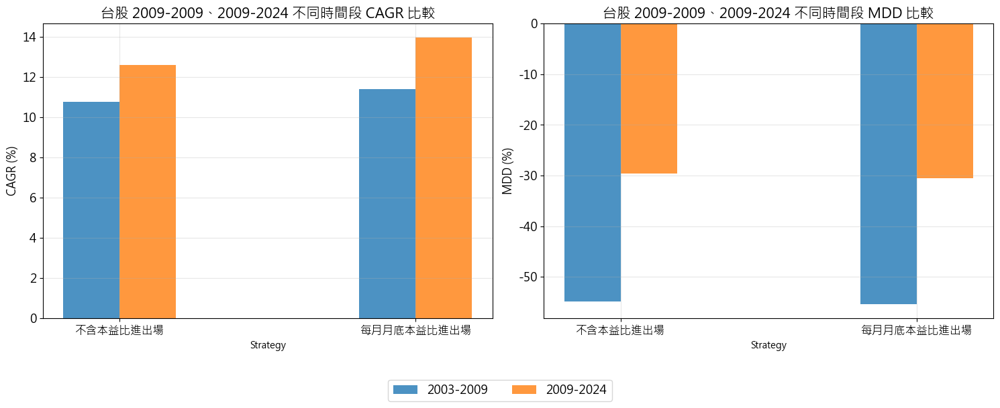

In [32]:
time_period_tests_df = time_period_rep_collec.selected_stock_count_analysis()
perform_compare_barchart(time_period_tests_df)

In [33]:
time_period_rep_collec.reports['台股_原始條件_每月月底本益比進出場_2003-2009'].display()

,annualized_rate_of_return,sharpe,max_drawdown,win_ratio
,11.38%,48.92,-55.38%,48.57%


,entry_date,exit_date,entry_sig_date,exit_sig_date,position,period,entry_index,exit_index,return,mae,gmfe,bmfe,mdd,pdays,weight,next_weights
stock_id,,,,,,,,,,,,,,,,
1303,2007-05-02,2009-04-01,2007-04-30,2009-03-31,0.028571,476,1834,2310,-0.235580,-0.381420,0.723721,0.723721,-0.641137,318.0,0.000000,0.000000
1473,2003-04-01,2009-04-01,2003-03-31,2009-03-31,0.500000,1491,819,2310,-0.259782,-0.358219,1.018494,1.018494,-0.682050,1315.0,0.000000,0.000000
1477,2005-04-01,2009-04-01,2005-03-31,2009-03-31,0.066667,991,1319,2310,0.145771,-0.260041,2.106229,2.106229,-0.761782,838.0,0.000000,0.000000
2002,2005-04-01,2009-04-01,2005-03-31,2009-03-31,0.066667,991,1319,2310,0.100460,-0.210383,1.376140,0.015704,-0.572777,757.0,0.000000,0.000000
2027,2007-05-02,2009-04-01,2007-04-30,2009-03-31,0.028571,476,1834,2310,-0.643627,-0.745723,0.103093,0.103093,-0.769487,42.0,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8046,2009-04-01,NaT,2009-03-31,NaT,0.022222,3875,2310,-1,1.400345,-0.686212,9.153406,0.880004,-0.833092,1787.0,0.022222,0.022222
8072,2009-04-01,NaT,2009-03-31,NaT,0.022222,3875,2310,-1,-0.467896,-0.614251,0.528405,0.528405,-0.747613,1390.0,0.022222,0.022222
8924,2005-04-01,NaT,2005-03-31,NaT,0.066667,4866,1319,-1,2.290481,-0.601674,5.249710,0.879408,-0.788058,2949.0,0.022222,0.022222


In [46]:
tw_bench = data.get('taiex:close')[START_DATE:END_DATE]
tw_bench['close'] = tw_bench['close'] / tw_bench['close'].iloc[0]

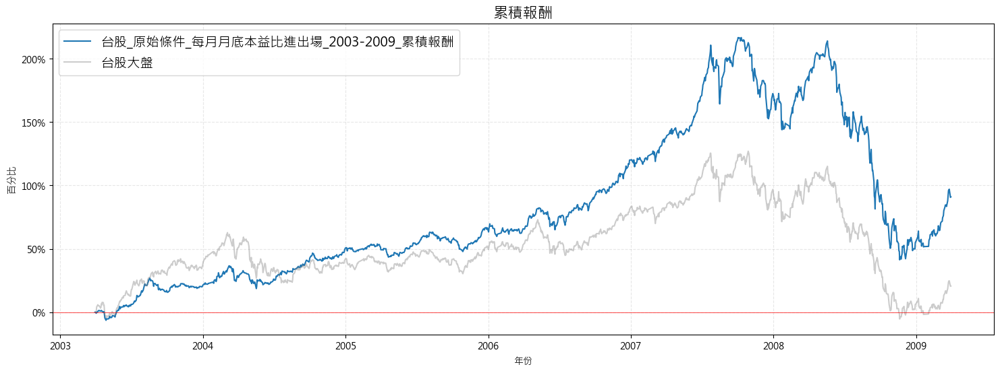

In [47]:
cum_returns = time_period_rep_collec.reports['台股_原始條件_每月月底本益比進出場_2003-2009'].stock_data['cum_returns']
tw_close = tw_bench['close'].reindex(cum_returns.index)

plt.figure(figsize=(18, 6))

# Plot cumulative returns
plt.plot(cum_returns.index, cum_returns, label='台股_原始條件_每月月底本益比進出場_2003-2009_累積報酬')

# Plot normalized close prices
plt.plot(tw_close.index, tw_close, label='台股大盤', color='gray', alpha=0.4)

plt.xlabel('年份')
plt.ylabel('百分比')
plt.axhline(1, color='red', linewidth=0.5)
plt.title('累積報酬', fontsize=16)
plt.legend(fontsize=14)
plt.grid(True, alpha=0.3, linestyle='--')

# Custom y-ticks formatter
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda x, pos: f'{(x - 1) * 100:.0f}%'))

plt.show()

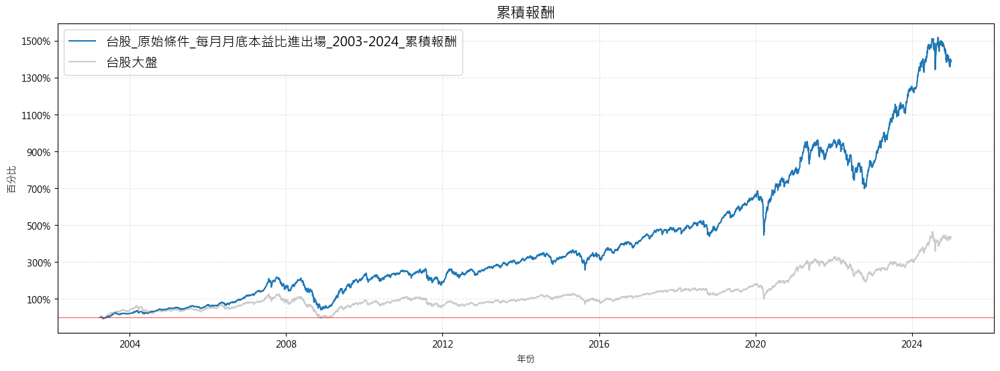

In [48]:
cum_returns = rep_all_cond.reports['台股_原始條件_每月月底本益比進出場'].stock_data['cum_returns']
tw_close = tw_bench['close'].reindex(cum_returns.index)

plt.figure(figsize=(18, 6))

# Plot cumulative returns
plt.plot(cum_returns.index, cum_returns, label='台股_原始條件_每月月底本益比進出場_2003-2024_累積報酬')

# Plot normalized close prices
plt.plot(tw_close.index, tw_close, label='台股大盤', color='gray', alpha=0.4)

plt.xlabel('年份')
plt.ylabel('百分比')
plt.axhline(1, color='red', linewidth=0.5)
plt.title('累積報酬', fontsize=16)
plt.legend(fontsize=14)
plt.grid(True, alpha=0.3, linestyle='--')

# Custom y-ticks formatter
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda x, pos: f'{(x - 1) * 100:.0f}%'))

plt.show()

## 獲利分佈

In [35]:
orig_strat_rep_test = rep_all_cond.reports['台股_原始條件_每月月底本益比進出場']

pos_df = orig_strat_rep_test.position
close_price_df = close[START_DATE:END_DATE]

In [36]:
monthly_first = close_price_df.resample('ME').first()
monthly_last = close_price_df.resample('ME').last()

# 計算股價每月的增長率：(月底股價/月初股價) - 1
monthly_returns_df = (monthly_last / monthly_first) - 1

In [37]:
# 每月資金分配比例 * 每月股價增長率
returns_pos_df = monthly_returns_df * pos_df.shift() # 向下移動一個row

In [38]:
# 轉換成年度數據，將各股在同一年的每月報酬率相加
returns_pos_df_annual = returns_pos_df.resample('YE').sum()
# returns_pos_df_annual.sum(axis=1)

In [39]:
def create_stacked_returns_plot(returns_pos_df_annual, top_N=None):
    from itertools import cycle

    # 年份列表
    years = returns_pos_df_annual.index.year.tolist()

    # 為每支股票生成唯一的顏色
    stocks = returns_pos_df_annual.columns.tolist()
    n_stocks = len(stocks)

    # 使用 plotly 的顏色配色方案
    all_colors = px.colors.qualitative.Plotly + px.colors.qualitative.Set1 + px.colors.qualitative.Pastel + px.colors.qualitative.Dark2
    color_cycle = cycle(all_colors)
    color_dict = {stock: next(color_cycle) for stock in stocks}

    # 創建用於正收益和負收益的空列表
    positive_traces = []
    negative_traces = []

    # 針對df中每支個股進行處理
    for stock in returns_pos_df_annual.columns:
        stock_returns = returns_pos_df_annual[stock]

        # 分離正收益和負收益
        positive_returns = stock_returns.copy()
        positive_returns[positive_returns <= 0] = 0

        negative_returns = stock_returns.copy()
        negative_returns[negative_returns >= 0] = 0

        # 如果有正收益，創建正收益trace
        if positive_returns.max() > 0:
            for year_idx, value in enumerate(positive_returns):
                if value > 0:  # 只添加正值
                    positive_traces.append({
                        'stock': stock,
                        'year_idx': year_idx,
                        'year': years[year_idx],
                        'return': value,
                        'color': color_dict[stock]
                    })

        # 如果有負收益，創建負收益trace
        if negative_returns.min() < 0:
            for year_idx, value in enumerate(negative_returns):
                if value < 0:  # 只添加負值
                    negative_traces.append({
                        'stock': stock,
                        'year_idx': year_idx,
                        'year': years[year_idx],
                        'return': value,
                        'color': color_dict[stock]
                    })

    # 創建圖表
    fig = go.Figure()

    # 按年份分組並排序正收益
    for year in years:
        year_traces = [t for t in positive_traces if t['year'] == year]
        # 按報酬值從大到小排序
        year_traces.sort(key=lambda x: x['return'], reverse=True)

        if top_N is not None and len(year_traces) > top_N:
            # 分離前N名和其他
            top_traces = year_traces[:top_N]
            other_traces = year_traces[top_N:]

            # 計算"其他"區塊的正報酬的總和
            other_sum = sum(trace['return'] for trace in other_traces)

            # 繪製"其他"區塊在正報酬bar stack的最底下
            if other_sum > 0:
                fig.add_trace(go.Bar(
                    name=f"其他 ({year})",
                    x=[year],
                    y=[other_sum],
                    base=[0],
                    marker=dict(
                        color='white',
                        pattern_shape="/",
                    ),
                    showlegend=False,
                    hovertemplate=f'%{{x}}<br>其他: %{{y:.2%}}<extra></extra>'
                ))

            # 再繪製前N名，堆疊在`其他`區塊的上方
            cumulative = other_sum
            for trace in reversed(top_traces):
                fig.add_trace(go.Bar(
                    name=trace['stock'],
                    x=[year],
                    y=[trace['return']],
                    base=[cumulative],
                    marker_color=trace['color'],
                    showlegend=False,
                    hovertemplate=f'{trace["stock"]}: {trace["return"]:.2%}<extra></extra>'
                ))
                cumulative += trace['return']
        else:
            # 全部顯示（從底部開始堆疊）
            cumulative = 0
            for trace in reversed(year_traces):
                fig.add_trace(go.Bar(
                    name=trace['stock'],
                    x=[year],
                    y=[trace['return']],
                    base=[cumulative],
                    marker_color=trace['color'],
                    showlegend=False,
                    hovertemplate=f'{trace["stock"]}: {trace["return"]:.2%}<extra></extra>'
                ))
                cumulative += trace['return']

    # 按年份分組並排序負收益
    for year in years:
        year_traces = [t for t in negative_traces if t['year'] == year]
        # 按報酬值從大到小排序（負值從小到大）
        year_traces.sort(key=lambda x: x['return'], reverse=True)

        cumulative = 0
        for trace in year_traces:
            fig.add_trace(go.Bar(
                name=trace['stock'],
                x=[year],
                y=[trace['return']],
                base=[cumulative],
                marker_color=trace['color'],
                showlegend=False,
                hovertemplate=f'{trace["stock"]}: {trace["return"]:.2%}<extra></extra>'
            ))
            cumulative += trace['return']

    # 添加唯一的圖例條目
    unique_stocks = sorted(set(trace['stock'] for trace in positive_traces + negative_traces))
    for stock in unique_stocks:
        fig.add_trace(go.Bar(
            name=stock,
            x=[None],
            y=[None],
            marker_color=color_dict[stock],
            showlegend=True,
            hoverinfo='skip'
        ))

    fig.add_trace(go.Bar(
        name="其他",
        x=[None],
        y=[None],
        marker=dict(
            color='white',
            pattern_shape="/",
        ),
        showlegend=True,
        hoverinfo='skip'
    ))

    fig.update_layout(
        barmode='relative',
        title='年度股票報酬分布',
        xaxis_title='年份',
        yaxis_title='報酬',
        yaxis_tickformat=".0%",
        xaxis=dict(
            tickmode='array',
            tickvals=list(range(min(years), max(years) + 1)),
            ticktext=list(range(min(years), max(years) + 1))
        ),
        showlegend=True,
        legend_title='股票',
        hovermode='closest',
        width=1400,  # 調整寬度以顯示所有年份
        height=600,
    )

    # 添加水平線
    fig.add_hline(y=0, line_width=1, line_dash="solid", line_color="black")

    return fig

In [40]:
# create_stacked_returns_plot(returns_pos_df_annual)

In [41]:
create_stacked_returns_plot(returns_pos_df_annual, 5)

In [42]:
# _,_=orig_strat_rep_test.calc_returns_contrib()

---

## 台股_布林通道濾網

In [34]:
# 大盤股價
taiex_close = data.get('taiex:close')['2000-3':END_DATE]
# 布林通道上中下通道
upperband, middleband, lowerband = talib.BBANDS(taiex_close.close, timeperiod=300, nbdevup=2.0, nbdevdn=2.0)

### 建立濾網

In [35]:
# 創建一個買賣訊號的DataFrame，初始值全部為True
tw_bollinger_signal = pd.Series(True, index=taiex_close.index)

# 記錄第一次跌破的價格
first_break_price = None
# 記錄是否已經回到lower band之上
crossed_above_lower = False
# 是否進入持續的 False 狀態直到突破中通道
in_selling_state = False

# 遍歷所有的日期
for date in taiex_close.index:
    price = taiex_close.close[date]
    lower = lowerband[date]
    middle = middleband[date]
    
    # 第一次跌破下通道
    if price < lower and first_break_price is None:
        first_break_price = price
        crossed_above_lower = False
    
    # 價格回到下通道之上
    elif price > lower:
        crossed_above_lower = True
    
    # 再次跌破下通道且符合賣出條件
    if price < lower and crossed_above_lower and price < first_break_price:
        
        tw_bollinger_signal[date] = False
        in_selling_state = True
    
    # 突破中通道則重置狀態
    if price > middle:
        tw_bollinger_signal[date] = True
        first_break_price = None
        crossed_above_lower = False
        in_selling_state = False
    
    # 在突破中通道之前保持賣出狀態
    if in_selling_state and price <= middle:
        tw_bollinger_signal[date] = False

In [36]:
# tw_bollinger_signal_1.to_csv('./performance_file/TW/taiex_bollinger_trade_signal_all.csv')

### 台股布林通道濾網_視覺化

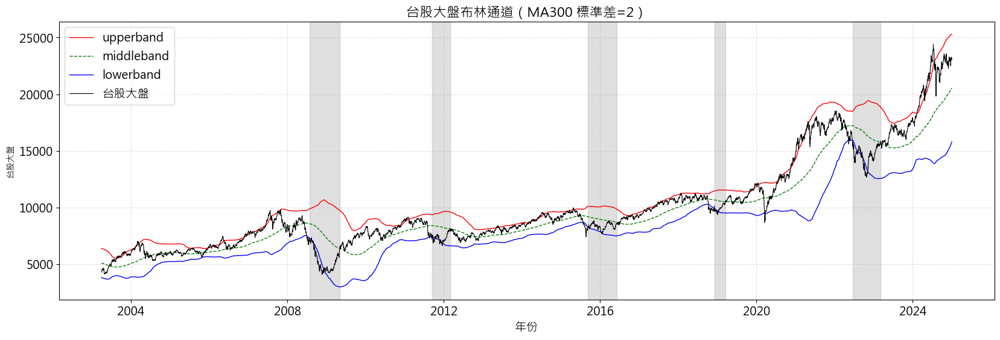

In [37]:
plt.figure(figsize=(20, 6))

plt.plot(upperband[START_DATE:END_DATE],label="upperband",color='r',linestyle='solid', linewidth=1)
plt.plot(middleband[START_DATE:END_DATE],label="middleband",color='g',linestyle='--', linewidth=1)
plt.plot(lowerband[START_DATE:END_DATE],label="lowerband",color='b',linestyle='solid', linewidth=1)
plt.plot(taiex_close[START_DATE:END_DATE],label="台股大盤",color='black', linewidth=0.8)

# 出場時間段
plt.axvspan(pd.Timestamp('2008-7-25'), pd.Timestamp('2009-5-5'), color='gray', alpha=0.25)
plt.axvspan(pd.Timestamp('2011-9-14'), pd.Timestamp('2012-3-1'), color='gray', alpha=0.25)
plt.axvspan(pd.Timestamp('2015-9-10'), pd.Timestamp('2016-6-6'), color='gray', alpha=0.25)
plt.axvspan(pd.Timestamp('2018-12-6'), pd.Timestamp('2019-3-19'), color='gray', alpha=0.25)
plt.axvspan(pd.Timestamp('2022-6-20'), pd.Timestamp('2023-3-3'), color='gray', alpha=0.25)

plt.title("台股大盤布林通道（MA300 標準差=2）", fontsize=16) 
plt.xlabel("年份", fontsize=14) 
plt.xticks(fontsize=14)
plt.ylabel("台股大盤")
plt.yticks(fontsize=14)

plt.legend(fontsize=14)
plt.grid(True, linestyle='--', alpha=0.4)
plt.show()

### 建立布林通道濾網交易訊號

In [38]:
bolling_filt = orig_all_cond.copy()

# 將 df 的 index 對齊 us_bollinger_signal_1 的 index，並填充為 True，這樣可以保證日期範圍內的所有日期都包括
aligned_signal = tw_bollinger_signal.reindex(bolling_filt.index, method='ffill', fill_value=True)

# 將 df 中日期對應的行設置為 aligned_signal 的值
bolling_filt.loc[aligned_signal.index, :] = aligned_signal.values[:, None]

### 有無濾網_綜合比較

In [39]:
bollinger_compare_dict = {}

bollinger_compare_dict['原始條件_無本益比'] = orig_all_cond[START_DATE:END_DATE]
bollinger_compare_dict['原始條件_無本益比_ROE出場條件'] = orig_all_cond[START_DATE:END_DATE] & (roe[START_DATE:END_DATE] > 15)
bollinger_compare_dict['原始條件_無本益比_布林通道'] = orig_all_cond[START_DATE:END_DATE] & bolling_filt[START_DATE:END_DATE]
bollinger_compare_dict['原始條件_無本益比_ROE出場條件_布林通道'] = orig_all_cond[START_DATE:END_DATE] & bolling_filt[START_DATE:END_DATE] & (roe[START_DATE:END_DATE] > 15)

bollinger_compare_dict['原始條件_有本益比'] = orig_all_cond_and_pe_daily[START_DATE:END_DATE]
bollinger_compare_dict['原始條件_有本益比_ROE出場條件'] = (orig_all_cond[START_DATE:END_DATE] & pe_cond_entry_daily[START_DATE:END_DATE]).hold_until((~orig_all_cond[START_DATE:END_DATE]) | pe_cond_exit_daily[START_DATE:END_DATE] | (roe[START_DATE:END_DATE] < 15))
bollinger_compare_dict['原始條件_有本益比_布林通道'] = (orig_all_cond[START_DATE:END_DATE] & pe_cond_entry_daily[START_DATE:END_DATE]).hold_until((~orig_all_cond[START_DATE:END_DATE]) | pe_cond_exit_daily[START_DATE:END_DATE] | ~bolling_filt[START_DATE:END_DATE])
bollinger_compare_dict['原始條件_有本益比_ROE出場條件_布林通道'] = (orig_all_cond[START_DATE:END_DATE] & pe_cond_entry_daily[START_DATE:END_DATE]).hold_until((~orig_all_cond[START_DATE:END_DATE]) | pe_cond_exit_daily[START_DATE:END_DATE] | ~bolling_filt[START_DATE:END_DATE] | (roe[START_DATE:END_DATE] < 15)) 

In [40]:
bollinger_compare_collecs = sim_conditions(bollinger_compare_dict, resample='ME', data=data)

Backtesting progress: 100%|██████████| 8/8 [00:19<00:00,  2.50s/condition]


In [41]:
bollinger_compare_collecs.plot_creturns()

In [42]:
bollinger_compare_collecs.selected_stock_count_analysis()

,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
原始條件_有本益比,13.21,-55.38,35.48,36.0,29.25,43.00,2.0,63.0
原始條件_有本益比_ROE出場條件,13.09,-55.20,28.92,29.5,23.00,36.00,1.0,56.0
原始條件_無本益比_ROE出場條件,12.79,-55.34,47.16,47.0,40.00,61.00,2.0,88.0
原始條件_無本益比,12.22,-54.84,56.11,58.0,52.00,72.75,3.0,100.0
原始條件_有本益比_布林通道,10.21,-31.18,23.51,27.0,16.00,36.00,0.0,56.0
原始條件_有本益比_ROE出場條件_布林通道,9.86,-31.49,19.56,19.0,13.00,31.00,0.0,49.0
原始條件_無本益比_ROE出場條件_布林通道,9.77,-29.63,38.74,45.0,19.00,59.00,0.0,88.0
原始條件_無本益比_布林通道,9.20,-29.66,46.46,56.5,20.00,70.00,0.0,100.0


#### CAGR比較

In [43]:
bollinger_compare_df = bollinger_compare_collecs.selected_stock_count_analysis().reset_index()

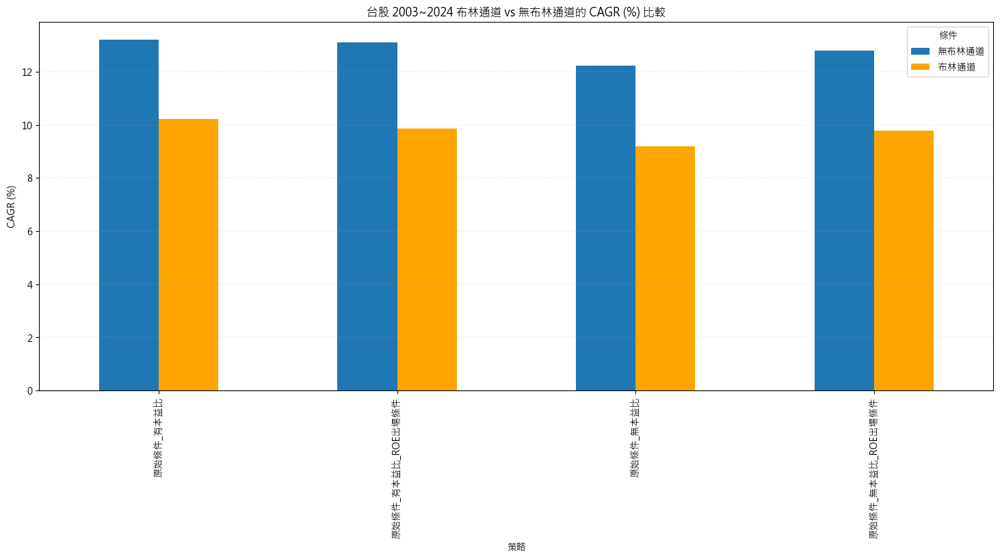

In [44]:
# 提取策略前綴，移除 '_布林通道' 作為分組依據
bollinger_compare_df["Base_Strategy"] = bollinger_compare_df["Strategy"].str.replace("_布林通道", "", regex=False)
bollinger_compare_df["Condition"] = bollinger_compare_df["Strategy"].str.contains("_布林通道")

# 計算有無布林通道的績效差異
comparison_df = bollinger_compare_df.pivot_table(
    index="Base_Strategy",  # 使用策略前綴作為索引
    columns="Condition",
    values="CAGR (%)"
)

# 調整列名，便於圖表呈現
comparison_df.columns = ["無布林通道", "布林通道"]
comparison_df = comparison_df.reset_index()

# 繪製條形圖
ax = comparison_df.plot(
    x="Base_Strategy",
    kind="bar",
    figsize=(18, 7),
    title="台股 2003~2024 布林通道 vs 無布林通道的 CAGR (%) 比較",
    ylabel="CAGR (%)",
    xlabel="策略",
    rot=90,
    color=['tab:blue', 'orange']
)

# 調整圖例
plt.legend(["無布林通道", "布林通道"], title="條件")
# plt.tight_layout()
plt.grid(axis='y', alpha=0.6, linestyle='--', linewidth=0.3)
plt.show()

#### MDD比較

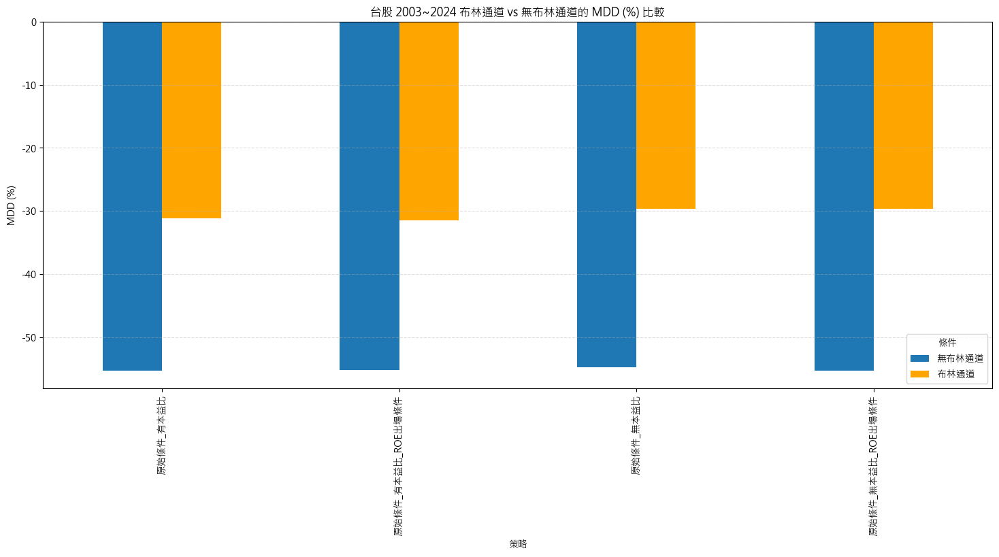

In [45]:
# 提取策略前綴，移除 '_布林通道' 作為分組依據
bollinger_compare_df["Base_Strategy"] = bollinger_compare_df["Strategy"].str.replace("_布林通道", "", regex=False)
bollinger_compare_df["Condition"] = bollinger_compare_df["Strategy"].str.contains("_布林通道") 

# 計算有無布林通道的績效差異
comparison_df = bollinger_compare_df.pivot_table(
    index="Base_Strategy",  # 使用策略前綴作為索引
    columns="Condition",
    values="MDD (%)"
)

# 調整列名，便於圖表呈現
comparison_df.columns = ["無布林通道", "布林通道"]
comparison_df = comparison_df.reset_index()

# 繪製條形圖
ax = comparison_df.plot(
    x="Base_Strategy",
    kind="bar",
    figsize=(18, 7),
    title="台股 2003~2024 布林通道 vs 無布林通道的 MDD (%) 比較",
    ylabel="MDD (%)",
    xlabel="策略",
    rot=90,
    color=['tab:blue', 'orange']
)


plt.legend(["無布林通道", "布林通道"], title="條件")
plt.grid(axis='y', alpha=0.4, linestyle='--')
plt.show()

---

## 比較是否考慮某項條件其對績效的影響

各因子公司占比

In [44]:
# 單一條件

all_conditions = {}

all_conditions['ROE五年平均大於15%'] = roe_15[START_DATE:END_DATE]
all_conditions['盈再率小於40%'] = rr_cond[START_DATE:END_DATE]
all_conditions['股利支付率(配息率)三年至少40%'] = payout_ratio_cond[START_DATE:END_DATE]
all_conditions['稅後淨利大於五億新台幣'] = profit_cond[START_DATE:END_DATE]
all_conditions['董監持股比率大於10%'] = hold_cond[START_DATE:END_DATE]
all_conditions['台股上市櫃滿兩年'] = listed[START_DATE:END_DATE]
all_conditions['董監持股比率大於10%_&_台股上市櫃滿兩年'] = (listed & hold_cond)[START_DATE:END_DATE]
all_conditions['本益比小於12進場'] = pe_cond_entry_daily[START_DATE:END_DATE]

all_conditions_count = sim_conditions(all_conditions, resample='ME', data=data)

Backtesting progress: 100%|██████████| 8/8 [02:45<00:00, 20.68s/condition]


In [45]:
all_conditions_count.selected_stock_count_analysis()

,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
董監持股比率大於10%_&_台股上市櫃滿兩年,14.31,-62.34,1016.48,1042.0,850.5,1224.0,445.0,1374.0
本益比小於12進場,14.11,-60.63,376.70,361.0,300.0,452.0,153.0,736.0
台股上市櫃滿兩年,14.10,-63.22,1234.91,1251.5,978.5,1534.0,510.0,1770.0
董監持股比率大於10%,14.00,-63.58,1133.98,1140.0,980.0,1313.0,745.0,1439.0
股利支付率(配息率)三年至少40%,13.86,-56.30,516.92,513.0,330.0,747.0,84.0,881.0
盈再率小於40%,13.65,-61.99,579.90,580.0,433.0,772.0,162.0,872.0
稅後淨利大於五億新台幣,11.26,-60.94,337.23,347.0,256.0,390.0,130.0,554.0
ROE五年平均大於15%,10.42,-66.31,304.12,300.0,280.0,325.0,199.0,414.0


In [46]:
all_conditions_count.selected_stock_count_analysis(ratio=True)

,CAGR (%),MDD (%),入選股數占比平均%,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
董監持股比率大於10%_&_台股上市櫃滿兩年,14.31,-62.34,73.55,74.63,73.91,75.49,53.72,78.77
本益比小於12進場,14.11,-60.63,28.73,26.84,20.30,35.12,8.40,60.66
台股上市櫃滿兩年,14.10,-63.22,88.53,90.86,87.51,93.04,61.51,95.87
董監持股比率大於10%,14.00,-63.58,84.42,84.06,80.63,87.53,78.50,91.47
股利支付率(配息率)三年至少40%,13.86,-56.30,35.74,38.05,28.76,46.20,9.88,48.77
盈再率小於40%,13.65,-61.99,41.45,43.66,38.73,46.77,19.62,49.76
稅後淨利大於五億新台幣,11.26,-60.94,24.33,24.49,22.48,26.14,15.26,31.44
ROE五年平均大於15%,10.42,-66.31,23.11,21.94,19.03,26.57,17.37,33.69


---

In [47]:
# 所有條件
condition_dict = {
    'ROE五年平均': roe_15,
    '盈再率': rr_cond,
    '三年配息率': payout_ratio_cond,
    '稅後淨利': profit_cond,
    '董監持股+上市櫃滿兩年': hold_cond & listed # 次要條件
}

# 分離 "董監持股+上市櫃滿兩年"(次要條件) 與其他條件
additional_condition_key = '董監持股+上市櫃滿兩年'
additional_condition = condition_dict.pop(additional_condition_key)

# 剩餘主要條件的 key
keys = list(condition_dict.keys())

# 創建交易訊號字典
signal_dict = {}

# 遍歷 2, 3, 4 的組合長度 (4個主要條件)
for r in range(2, 5):
    combinations = itertools.combinations(keys, r)
    for combo in combinations:
        # 組合名稱
        combo_name = '+'.join(combo)

        # 條件的 AND 結果
        combined_condition = condition_dict[combo[0]]
        for key in combo[1:]:
            combined_condition &= condition_dict[key]

        # 加入不含 "董監持股+上市櫃滿兩年" 的組合
        signal_dict[combo_name] = combined_condition[START_DATE:END_DATE]

        # 加入含 "董監持股+上市櫃滿兩年" 的組合
        combo_name_with_additional = f"{combo_name}_{additional_condition_key}"
        signal_dict[combo_name_with_additional] = (combined_condition & additional_condition)[START_DATE:END_DATE]

# 添加本益比進出場的組合
pe_signal_dict = {}
for name, sig in signal_dict.items():
    # 原組合的本益比進出場
    pe_signal_dict[f"{name}_本益比進出場"] = (sig[START_DATE:END_DATE] & pe_cond_entry_daily[START_DATE:END_DATE]).hold_until((~sig[START_DATE:END_DATE]) | pe_cond_exit_daily[START_DATE:END_DATE])

    # 含 "董監持股+上市櫃滿兩年" 的組合的本益比進出場
    if additional_condition_key in name:
        pe_signal_dict[f"{name}_本益比進出場"] = (sig[START_DATE:END_DATE] & pe_cond_entry_daily[START_DATE:END_DATE]).hold_until((~sig[START_DATE:END_DATE]) | pe_cond_exit_daily[START_DATE:END_DATE])

# 合併所有組合
signal_dict.update(pe_signal_dict)

# print出所有組合名稱
for name, condition in signal_dict.items():
    print(name)

ROE五年平均+盈再率
ROE五年平均+盈再率_董監持股+上市櫃滿兩年
ROE五年平均+三年配息率
ROE五年平均+三年配息率_董監持股+上市櫃滿兩年
ROE五年平均+稅後淨利
ROE五年平均+稅後淨利_董監持股+上市櫃滿兩年
盈再率+三年配息率
盈再率+三年配息率_董監持股+上市櫃滿兩年
盈再率+稅後淨利
盈再率+稅後淨利_董監持股+上市櫃滿兩年
三年配息率+稅後淨利
三年配息率+稅後淨利_董監持股+上市櫃滿兩年
ROE五年平均+盈再率+三年配息率
ROE五年平均+盈再率+三年配息率_董監持股+上市櫃滿兩年
ROE五年平均+盈再率+稅後淨利
ROE五年平均+盈再率+稅後淨利_董監持股+上市櫃滿兩年
ROE五年平均+三年配息率+稅後淨利
ROE五年平均+三年配息率+稅後淨利_董監持股+上市櫃滿兩年
盈再率+三年配息率+稅後淨利
盈再率+三年配息率+稅後淨利_董監持股+上市櫃滿兩年
ROE五年平均+盈再率+三年配息率+稅後淨利
ROE五年平均+盈再率+三年配息率+稅後淨利_董監持股+上市櫃滿兩年
ROE五年平均+盈再率_本益比進出場
ROE五年平均+盈再率_董監持股+上市櫃滿兩年_本益比進出場
ROE五年平均+三年配息率_本益比進出場
ROE五年平均+三年配息率_董監持股+上市櫃滿兩年_本益比進出場
ROE五年平均+稅後淨利_本益比進出場
ROE五年平均+稅後淨利_董監持股+上市櫃滿兩年_本益比進出場
盈再率+三年配息率_本益比進出場
盈再率+三年配息率_董監持股+上市櫃滿兩年_本益比進出場
盈再率+稅後淨利_本益比進出場
盈再率+稅後淨利_董監持股+上市櫃滿兩年_本益比進出場
三年配息率+稅後淨利_本益比進出場
三年配息率+稅後淨利_董監持股+上市櫃滿兩年_本益比進出場
ROE五年平均+盈再率+三年配息率_本益比進出場
ROE五年平均+盈再率+三年配息率_董監持股+上市櫃滿兩年_本益比進出場
ROE五年平均+盈再率+稅後淨利_本益比進出場
ROE五年平均+盈再率+稅後淨利_董監持股+上市櫃滿兩年_本益比進出場
ROE五年平均+三年配息率+稅後淨利_本益比進出場
ROE五年平均+三年配息率+稅後淨利_董監持股+上市櫃滿兩年_本益比進出場
盈再率+三年配息率+稅後淨利_本益比進出場
盈再率+三年配息率+稅後淨利_董監持股+上市櫃滿兩年_本益比進出場
ROE五年平均+盈再

In [48]:
signal_dict_comb = sim_conditions(signal_dict, resample='ME', data=data)
signal_dict_comb.selected_stock_count_analysis()

Backtesting progress: 100%|██████████| 44/44 [03:54<00:00,  5.33s/condition]


,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
盈再率+三年配息率_董監持股+上市櫃滿兩年_本益比進出場,15.26,-53.46,172.58,182.0,129.00,226.00,11.0,290.0
盈再率+三年配息率_本益比進出場,15.07,-56.01,222.34,229.0,159.50,301.75,17.0,389.0
盈再率+三年配息率+稅後淨利_本益比進出場,14.40,-54.79,96.10,97.0,63.25,130.00,5.0,191.0
盈再率+三年配息率_董監持股+上市櫃滿兩年,14.16,-54.49,281.16,284.0,186.25,419.00,31.0,456.0
盈再率+三年配息率+稅後淨利_董監持股+上市櫃滿兩年_本益比進出場,13.99,-53.93,65.61,69.5,48.00,81.75,4.0,131.0
盈再率+三年配息率,13.94,-57.26,352.32,347.0,229.00,548.00,40.0,592.0
三年配息率+稅後淨利_本益比進出場,13.94,-54.28,140.75,133.0,94.50,191.75,7.0,286.0
三年配息率+稅後淨利_董監持股+上市櫃滿兩年_本益比進出場,13.76,-53.78,97.47,98.0,73.00,121.00,6.0,192.0
盈再率+三年配息率+稅後淨利,13.22,-55.14,138.09,132.0,86.00,196.00,8.0,273.0


In [49]:
pd.options.display.float_format = '{:.2f}'.format


def analyze_signal_groups(signal_dict_comb):
    # 初始化結果字典
    results = {
        '包含ROE五年平均': [],
        '包含盈再率': [],
        '包含配息率': [],
        '包含稅後淨利': [],
        # '包含董監持股+上市櫃滿兩年': []
    }

    # 遍歷策略並分類
    for strategy in signal_dict_comb.index:
        if 'ROE五年平均' in strategy:
            results['包含ROE五年平均'].append(strategy)
        if '盈再率' in strategy:
            results['包含盈再率'].append(strategy)
        if '三年配息率' in strategy:
            results['包含配息率'].append(strategy)
        if '稅後淨利' in strategy:
            results['包含稅後淨利'].append(strategy)
        # if '董監持股+上市櫃滿兩年' in strategy:
        #     results['包含董監持股+上市櫃滿兩年'].append(strategy)

    # 計算每組的平均值，細分為包含/不包含條件、有/無本益比進出場、綜合
    summary_data = []
    for group, strategies in results.items():
        condition_name = group.split('包含')[1]

        # 包含條件與不包含條件
        for include_condition in [True, False]:
            filtered_strategies_condition = [s for s in signal_dict_comb.index if (condition_name in s) == include_condition]

            # 細分有/無本益比進出場
            for include_pe in [True, False]:
                filtered_strategies = [s for s in filtered_strategies_condition if ('本益比進出場' in s) == include_pe]
                if filtered_strategies:
                    filtered_df = signal_dict_comb.loc[filtered_strategies]
                    avg_cagr = filtered_df['CAGR (%)'].mean()
                    avg_mdd = filtered_df['MDD (%)'].mean()
                    avg_selected_stock = filtered_df['入選股數平均'].mean()
                    condition_label = f"{'包含' if include_condition else '不包含'}{condition_name} ({'含本益比進出場' if include_pe else '不含本益比進出場'})"
                    summary_data.append([condition_label, avg_cagr, avg_mdd, avg_selected_stock])

            # 綜合分析
            combined_df = signal_dict_comb.loc[filtered_strategies_condition]
            if not combined_df.empty:
                avg_cagr_combined = combined_df['CAGR (%)'].mean()
                avg_mdd_combined = combined_df['MDD (%)'].mean()
                avg_selected_stock_combined = combined_df['入選股數平均'].mean()
                condition_label = f"{'包含' if include_condition else '不包含'}{condition_name} (綜合)"
                summary_data.append([condition_label, avg_cagr_combined, avg_mdd_combined, avg_selected_stock_combined])

    # 返回新的 DataFrame
    summary_df = pd.DataFrame(summary_data, columns=['Group', 'Average CAGR (%)', 'Average MDD (%)', 'Average Selected Stock Count'])
    return summary_df

# signal_dict_comb = sim_conditions(signal_dict, resample='ME', data=data)
summary_df = analyze_signal_groups(signal_dict_comb.selected_stock_count_analysis())
summary_df

,Group,Average CAGR (%),Average MDD (%),Average Selected Stock Count
0,包含ROE五年平均 (含本益比進出場),12.02,-57.99,78.94
1,包含ROE五年平均 (不含本益比進出場),11.04,-59.20,116.58
2,包含ROE五年平均 (綜合),11.53,-58.60,97.76
3,不包含ROE五年平均 (含本益比進出場),14.10,-54.99,128.65
4,不包含ROE五年平均 (不含本益比進出場),13.00,-55.24,194.38
5,不包含ROE五年平均 (綜合),13.55,-55.12,161.51
6,包含盈再率 (含本益比進出場),13.08,-57.23,99.55
7,包含盈再率 (不含本益比進出場),12.15,-58.24,149.57
8,包含盈再率 (綜合),12.61,-57.74,124.56
9,不包含盈再率 (含本益比進出場),12.25,-56.31,92.59


### 繪圖

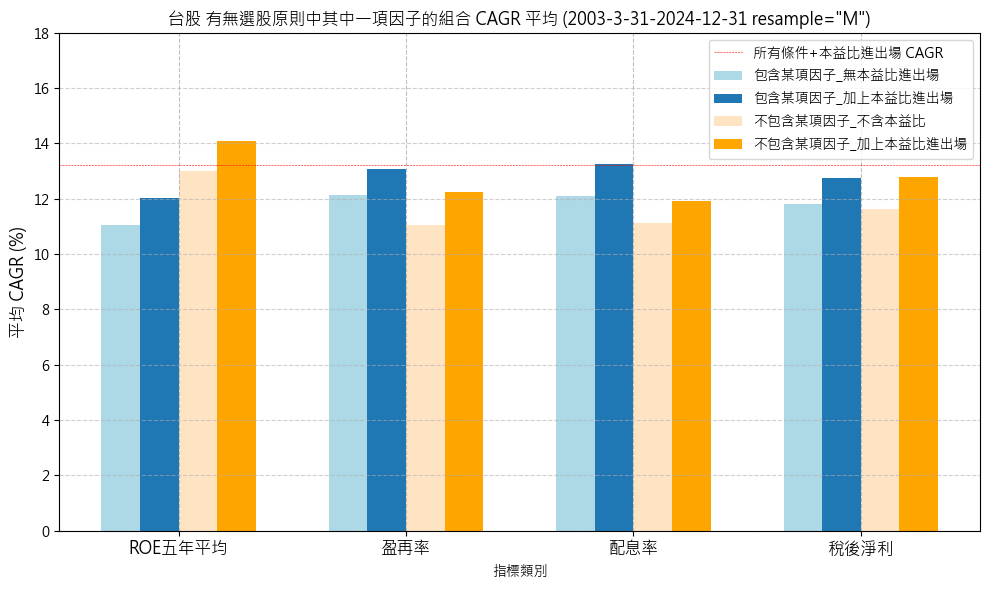

In [50]:
# 創建DataFrame
df = summary_df.copy()

# # 處理數據：提取所需的行（包含/不包含且是含本益比進出場的組合）
# mask = df['Group'].str.contains('含本益比進出場')
# filtered_df = df[mask].copy()

# # 定義類別順序
# categories = ['ROE五年平均', '盈再率', '配息率', '稅後淨利']

# # 創建類別對應的數據
# included_values = []
# excluded_values = []

# for category in categories:
#     # 獲取包含該類別的資料
#     included_mask = filtered_df['Group'].str.contains(f'包含{category}')
#     excluded_mask = filtered_df['Group'].str.contains(f'不包含{category}')
    
#     included_value = filtered_df[included_mask]['Average CAGR (%)'].values[0]
#     excluded_value = filtered_df[excluded_mask]['Average CAGR (%)'].values[0]
    
#     included_values.append(included_value)
#     excluded_values.append(excluded_value)

# # 設置圖表風格和大小
# # plt.style.use('seaborn')
# plt.figure(figsize=(14, 6))

# # 設置bar的寬度
# width = 0.17

# # 設置x軸位置
# x = np.arange(len(categories))

# # 繪製條形圖
# bars1 = plt.bar(x - width/2, included_values, width, label='包含', color='tab:blue')
# bars2 = plt.bar(x + width/2, excluded_values, width, label='不包含', color='orange')

# # 設置圖表標題和標籤
# plt.title('台股 有無選股原則中其中一項因子的組合 CAGR 平均 (含本益比進出場)', fontsize=12)
# plt.xlabel('指標類別')
# plt.ylabel('Average CAGR (%)')

# # 設置x軸刻度和標籤
# plt.xticks(x, categories)

# # 設置y軸範圍
# plt.ylim(0, 16)

# # 添加網格線
# plt.grid(True, linestyle='--', alpha=0.8)

# benchmark_value = signal_dict_comb.selected_stock_count_analysis().loc['ROE五年平均+盈再率+三年配息率+稅後淨利_董監持股+上市櫃滿兩年_本益比進出場']['CAGR (%)']
# plt.axhline(y=benchmark_value, color='red', linestyle='--', label='所有條件+本益比進出場 CAGR', linewidth=0.3)

# # 添加圖例
# plt.legend(loc='upper center', bbox_to_anchor=(1.15, 1), fontsize=10)

# # 調整布局
# plt.tight_layout()

# # 顯示圖表
# plt.show()

# 定義類別順序
categories = ['ROE五年平均', '盈再率', '配息率', '稅後淨利']

# 創建類別對應的數據
included_no_pe_values = []  # 包含但不含本益比
included_with_pe_values = []  # 包含且含本益比
excluded_no_pe_values = []  # 不包含且不含本益比
excluded_with_pe_values = []  # 不包含且含本益比

for category in categories:
    # 包含且不含本益比
    mask_included_no_pe = df['Group'].str.contains(f'包含{category} \(不含本益比進出場\)')
    included_no_pe_values.append(df[mask_included_no_pe]['Average CAGR (%)'].values[0])
    
    # 包含且含本益比
    mask_included_with_pe = df['Group'].str.contains(f'包含{category} \(含本益比進出場\)')
    included_with_pe_values.append(df[mask_included_with_pe]['Average CAGR (%)'].values[0])
    
    # 不包含且不含本益比
    mask_excluded_no_pe = df['Group'].str.contains(f'不包含{category} \(不含本益比進出場\)')
    excluded_no_pe_values.append(df[mask_excluded_no_pe]['Average CAGR (%)'].values[0])
    
    # 不包含且含本益比
    mask_excluded_with_pe = df['Group'].str.contains(f'不包含{category} \(含本益比進出場\)')
    excluded_with_pe_values.append(df[mask_excluded_with_pe]['Average CAGR (%)'].values[0])

# 設置圖表大小
plt.figure(figsize=(10, 6))

# 設置bar的寬度
width = 0.17

# 設置x軸位置
x = np.arange(len(categories))

# 繪製條形圖
bars1 = plt.bar(x - width*1.5, included_no_pe_values, width, 
                label='包含某項因子_無本益比進出場', color='lightblue')
bars2 = plt.bar(x - width/2, included_with_pe_values, width, 
                label='包含某項因子_加上本益比進出場', color='tab:blue')
bars3 = plt.bar(x + width/2, excluded_no_pe_values, width, 
                label='不包含某項因子_不含本益比', color='bisque')
bars4 = plt.bar(x + width*1.5, excluded_with_pe_values, width, 
                label='不包含某項因子_加上本益比進出場', color='orange')

# 設置圖表標題和標籤
plt.title(f'台股 有無選股原則中其中一項因子的組合 CAGR 平均 ({START_DATE}-{END_DATE} resample="M")', fontsize=12)
plt.xlabel('指標類別')
plt.ylabel('平均 CAGR (%)', fontsize=12)

# 設置x軸刻度和標籤
plt.xticks(x, categories, fontsize=12)

# 設置y軸範圍
plt.ylim(0, 18)

# # 添加網格線
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.grid(axis='x', linestyle='--', alpha=0.8)

# 添加基準線
benchmark_value = signal_dict_comb.selected_stock_count_analysis().loc['ROE五年平均+盈再率+三年配息率+稅後淨利_董監持股+上市櫃滿兩年_本益比進出場']['CAGR (%)']
plt.axhline(y=benchmark_value, color='red', linestyle='--', 
            label='所有條件+本益比進出場 CAGR', linewidth=0.4)

# # 在bar上添加數值標籤
# def add_value_labels(bars):
#     for bar in bars:
#         height = bar.get_height()
#         plt.text(bar.get_x() + bar.get_width()/2., height,
#                 f'{height:.2f}%',
#                 ha='center', va='bottom',
#                 fontsize=8)

# add_value_labels(bars1)
# add_value_labels(bars2)
# add_value_labels(bars3)
# add_value_labels(bars4)

# 添加圖例
plt.legend()
# plt.legend(loc='upper center', bbox_to_anchor=(1, 1), fontsize=12)

# 調整布局
plt.tight_layout()

# 顯示圖表
plt.show()

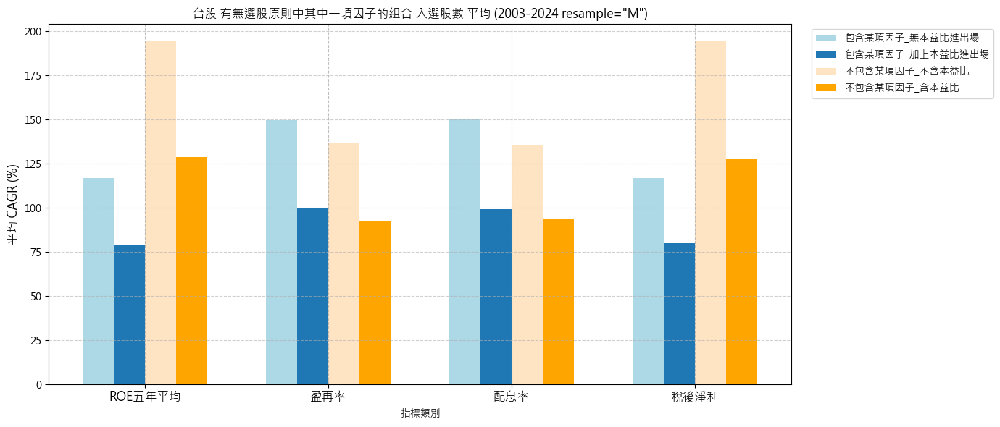

In [51]:
# 創建DataFrame
df = summary_df.copy()


# 定義類別順序
categories = ['ROE五年平均', '盈再率', '配息率', '稅後淨利']

# 創建類別對應的數據
included_no_pe_values = []  # 包含但不含本益比
included_with_pe_values = []  # 包含且含本益比
excluded_no_pe_values = []  # 不包含且不含本益比
excluded_with_pe_values = []  # 不包含且含本益比

for category in categories:
    # 包含且不含本益比
    mask_included_no_pe = df['Group'].str.contains(f'包含{category} \(不含本益比進出場\)')
    included_no_pe_values.append(df[mask_included_no_pe]['Average Selected Stock Count'].values[0])
    
    # 包含且含本益比
    mask_included_with_pe = df['Group'].str.contains(f'包含{category} \(含本益比進出場\)')
    included_with_pe_values.append(df[mask_included_with_pe]['Average Selected Stock Count'].values[0])
    
    # 不包含且不含本益比
    mask_excluded_no_pe = df['Group'].str.contains(f'不包含{category} \(不含本益比進出場\)')
    excluded_no_pe_values.append(df[mask_excluded_no_pe]['Average Selected Stock Count'].values[0])
    
    # 不包含且含本益比
    mask_excluded_with_pe = df['Group'].str.contains(f'不包含{category} \(含本益比進出場\)')
    excluded_with_pe_values.append(df[mask_excluded_with_pe]['Average Selected Stock Count'].values[0])

# 設置圖表大小
plt.figure(figsize=(14, 6))

# 設置bar的寬度
width = 0.17

# 設置x軸位置
x = np.arange(len(categories))

# 繪製條形圖
bars1 = plt.bar(x - width*1.5, included_no_pe_values, width, 
                label='包含某項因子_無本益比進出場', color='lightblue')
bars2 = plt.bar(x - width/2, included_with_pe_values, width, 
                label='包含某項因子_加上本益比進出場', color='tab:blue')
bars3 = plt.bar(x + width/2, excluded_no_pe_values, width, 
                label='不包含某項因子_不含本益比', color='bisque')
bars4 = plt.bar(x + width*1.5, excluded_with_pe_values, width, 
                label='不包含某項因子_含本益比', color='orange')

# 設置圖表標題和標籤
plt.title('台股 有無選股原則中其中一項因子的組合 入選股數 平均 (2003-2024 resample="M")', fontsize=12)
plt.xlabel('指標類別')
plt.ylabel('平均 CAGR (%)', fontsize=12)

# 設置x軸刻度和標籤
plt.xticks(x, categories, fontsize=12)

# # 設置y軸範圍
# plt.ylim(0, 16)

# # 添加網格線
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.grid(axis='x', linestyle='--', alpha=0.8)



# 添加圖例
plt.legend(loc='upper center', bbox_to_anchor=(1.15, 1), fontsize=10)

# 調整布局
plt.tight_layout()

# 顯示圖表
plt.show()

In [52]:
# # 創建DataFrame
# df = summary_df

# # 設定中文字型
# plt.rcParams['font.sans-serif'] = ['Microsoft JhengHei']
# plt.rcParams['axes.unicode_minus'] = False

# # 處理數據：提取所需的行（包含/不包含且是含本益比進出場的組合）
# mask = df['Group'].str.contains('不含本益比進出場')
# filtered_df = df[mask].copy()

# # 定義類別順序
# categories = ['ROE五年平均', '盈再率', '配息率', '稅後淨利']

# # 創建類別對應的數據
# included_values = []
# excluded_values = []

# for category in categories:
#     # 獲取包含該類別的資料
#     included_mask = filtered_df['Group'].str.contains(f'包含{category}')
#     excluded_mask = filtered_df['Group'].str.contains(f'不包含{category}')
    
#     included_value = filtered_df[included_mask]['Average CAGR (%)'].values[0]
#     excluded_value = filtered_df[excluded_mask]['Average CAGR (%)'].values[0]
    
#     included_values.append(included_value)
#     excluded_values.append(excluded_value)

# # 設置圖表風格和大小
# # plt.style.use('seaborn')
# plt.figure(figsize=(14, 5))

# # 設置bar的寬度
# width = 0.17

# # 設置x軸位置
# x = np.arange(len(categories))

# # 繪製條形圖
# bars1 = plt.bar(x - width/2, included_values, width, label='包含', color='tab:blue')
# bars2 = plt.bar(x + width/2, excluded_values, width, label='不包含', color='orange')

# # 設置圖表標題和標籤
# plt.title('台股 有無選股原則中其中一項因子的組合 CAGR 平均 (不含本益比進出場)', fontsize=12)
# plt.xlabel('指標類別')
# plt.ylabel('Average CAGR (%)')

# # 設置x軸刻度和標籤
# plt.xticks(x, categories)



# # 設置y軸範圍
# plt.ylim(0, 16)

# # 添加網格線
# plt.grid(True, linestyle='--', alpha=0.8)

# benchmark_value=signal_dict_comb.selected_stock_count_analysis().loc['ROE五年平均+盈再率+三年配息率+稅後淨利_董監持股+上市櫃滿兩年']['CAGR (%)']
# plt.axhline(y=benchmark_value, color='red', linestyle='--', label='所有條件_沒有本益比進出場CAGR', linewidth=0.3)

# # 添加圖例
# plt.legend(loc='upper center', bbox_to_anchor=(1.15, 1), fontsize=12)


# # 調整布局
# plt.tight_layout()

# # 顯示圖表
# plt.show()

---

In [53]:
sum_compare_dict={}

sig_1 = rr_cond & payout_ratio_cond
sig_2 = payout_ratio_cond & profit_cond
sig_3 = rr_cond & profit_cond

sig_4 = rr_cond & payout_ratio_cond & profit_cond
sig_5 = rr_cond & payout_ratio_cond & profit_cond & roe_15

sig_filter = hold_cond & listed

sum_compare_dict['盈再率+配息率'] = sig_1[START_DATE:END_DATE]
sum_compare_dict['盈再率+配息率_本益比'] = (sig_1 & pe_cond_entry_daily).hold_until((~sig_1) | pe_cond_exit_daily)[START_DATE:END_DATE]
sum_compare_dict['盈再率+配息率+董監持股+上市櫃滿兩年'] = (sig_1 & sig_filter)[START_DATE:END_DATE]
sum_compare_dict['盈再率+配息率+董監持股+上市櫃滿兩年_本益比'] = (sig_1 & sig_filter & pe_cond_entry_daily).hold_until((~(sig_1 & sig_filter)) | pe_cond_exit_daily)[START_DATE:END_DATE]

sum_compare_dict['配息率+稅後淨利'] = sig_2[START_DATE:END_DATE]
sum_compare_dict['配息率+稅後淨利_本益比'] = (sig_2 & pe_cond_entry_daily).hold_until((~sig_2) | pe_cond_exit_daily)[START_DATE:END_DATE]
sum_compare_dict['配息率+稅後淨利+董監持股+上市櫃滿兩年'] = (sig_2 & sig_filter)[START_DATE:END_DATE]
sum_compare_dict['配息率+稅後淨利+董監持股+上市櫃滿兩年_本益比'] = (sig_2 & sig_filter & pe_cond_entry_daily).hold_until((~(sig_2 & sig_filter)) | pe_cond_exit_daily)[START_DATE:END_DATE]

sum_compare_dict['盈再率+稅後淨利'] = sig_3[START_DATE:END_DATE]
sum_compare_dict['盈再率+稅後淨利_本益比'] = (sig_3 & pe_cond_entry_daily).hold_until((~sig_3) | pe_cond_exit_daily)[START_DATE:END_DATE]
sum_compare_dict['盈再率+稅後淨利+董監持股+上市櫃滿兩年'] = (sig_3 & sig_filter)[START_DATE:END_DATE]
sum_compare_dict['盈再率+稅後淨利+董監持股+上市櫃滿兩年_本益比'] = (sig_3 & sig_filter & pe_cond_entry_daily).hold_until((~(sig_3 & sig_filter)) | pe_cond_exit_daily)[START_DATE:END_DATE]

sum_compare_dict['盈再率+配息率+稅後淨利'] = sig_4[START_DATE:END_DATE]
sum_compare_dict['盈再率+配息率+稅後淨利_本益比'] = (sig_4 & pe_cond_entry_daily).hold_until((~sig_4) | pe_cond_exit_daily)[START_DATE:END_DATE]
sum_compare_dict['盈再率+配息率+稅後淨利+董監持股+上市櫃滿兩年'] = (sig_4 & sig_filter)[START_DATE:END_DATE]
sum_compare_dict['盈再率+配息率+稅後淨利+董監持股+上市櫃滿兩年_本益比'] = (sig_4 & sig_filter & pe_cond_entry_daily).hold_until((~(sig_4 & sig_filter)) | pe_cond_exit_daily)[START_DATE:END_DATE]

sum_compare_dict['ROE五年平均+盈再率+配息率+稅後淨利'] = sig_5[START_DATE:END_DATE]
sum_compare_dict['ROE五年平均+盈再率+配息率+稅後淨利_本益比'] = (sig_5 & pe_cond_entry_daily).hold_until((~sig_5) | pe_cond_exit_daily)[START_DATE:END_DATE]
sum_compare_dict['ROE五年平均+盈再率+配息率+稅後淨利+董監持股+上市櫃滿兩年'] = (sig_5 & sig_filter)[START_DATE:END_DATE]
sum_compare_dict['ROE五年平均+盈再率+配息率+稅後淨利+董監持股+上市櫃滿兩年_本益比'] = (sig_5 & sig_filter & pe_cond_entry_daily).hold_until((~(sig_5 & sig_filter)) | pe_cond_exit_daily)[START_DATE:END_DATE]

sum_compare_strat_collecs = sim_conditions(sum_compare_dict, resample='ME', data=data) 

sum_compare_strat_collecs.selected_stock_count_analysis()

Backtesting progress: 100%|██████████| 20/20 [03:02<00:00,  9.15s/condition]


,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
盈再率+配息率+董監持股+上市櫃滿兩年_本益比,14.96,-53.46,172.71,182.00,129.00,226.00,17.00,290.00
盈再率+配息率_本益比,14.87,-56.01,222.47,229.00,159.50,301.75,23.00,389.00
盈再率+配息率+稅後淨利_本益比,14.47,-54.79,96.10,97.00,63.25,130.00,6.00,191.00
盈再率+配息率+董監持股+上市櫃滿兩年,14.16,-54.49,281.16,284.00,186.25,419.00,31.00,456.00
盈再率+配息率+稅後淨利+董監持股+上市櫃滿兩年_本益比,14.10,-53.93,65.61,69.50,48.00,81.75,5.00,131.00
配息率+稅後淨利_本益比,14.04,-54.28,140.76,133.00,94.50,191.75,9.00,286.00
盈再率+配息率,13.94,-57.26,352.32,347.00,229.00,548.00,40.00,592.00
配息率+稅後淨利+董監持股+上市櫃滿兩年_本益比,13.89,-53.78,97.48,98.00,73.00,121.00,8.00,192.00
盈再率+配息率+稅後淨利,13.22,-55.14,138.09,132.00,86.00,196.00,8.00,273.00


In [54]:
sum_compare_strat_collecs.selected_stock_count_analysis(ratio=True)

,CAGR (%),MDD (%),入選股數占比平均%,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
盈再率+配息率+董監持股+上市櫃滿兩年_本益比,14.96,-53.46,12.02,13.31,9.75,14.50,2.07,16.73
盈再率+配息率_本益比,14.87,-56.01,15.40,17.01,13.42,18.58,2.80,22.10
盈再率+配息率+稅後淨利_本益比,14.47,-54.79,6.57,7.17,5.45,8.00,0.73,10.78
盈再率+配息率+董監持股+上市櫃滿兩年,14.16,-54.49,19.18,20.75,16.59,24.83,3.78,27.08
盈再率+配息率+稅後淨利+董監持股+上市櫃滿兩年_本益比,14.10,-53.93,4.55,4.67,4.02,5.50,0.61,7.34
配息率+稅後淨利_本益比,14.04,-54.28,9.68,10.13,8.21,11.44,1.10,16.03
盈再率+配息率,13.94,-57.26,24.20,25.67,20.48,32.50,4.71,35.08
配息率+稅後淨利+董監持股+上市櫃滿兩年_本益比,13.89,-53.78,6.82,6.93,6.47,7.57,0.98,10.76
盈再率+配息率+稅後淨利,13.22,-55.14,9.39,9.87,7.45,12.44,0.90,15.25


In [55]:
sum_compare_strat_collecs.reports['盈再率+配息率+董監持股+上市櫃滿兩年_本益比'].display()

,annualized_rate_of_return,sharpe,max_drawdown,win_ratio
,14.96%,19.41,-53.46%,68.1%


,entry_date,exit_date,entry_sig_date,exit_sig_date,position,period,entry_index,exit_index,return,mae,gmfe,bmfe,mdd,pdays,weight,next_weights
stock_id,,,,,,,,,,,,,,,,
1102,2018-11-01,NaT,2018-10-31,NaT,0.00,1501.00,4684.00,-1.00,0.77,-0.03,1.09,0.02,-0.27,1485.00,0.01,0.01
1109,2023-09-01,NaT,2023-08-31,NaT,0.00,325.00,5860.00,-1.00,0.03,-0.04,0.15,0.00,-0.13,200.00,0.01,0.01
1232,2003-04-01,NaT,2003-03-31,NaT,0.06,5366.00,819.00,-1.00,25.73,-0.07,27.55,0.01,-0.53,5208.00,0.01,0.01
1339,2023-04-06,NaT,2023-03-31,NaT,0.00,427.00,5758.00,-1.00,0.34,-0.06,0.93,0.00,-0.32,360.00,0.01,0.01
1436,2024-05-02,NaT,2024-04-30,NaT,0.01,166.00,6019.00,-1.00,-0.06,-0.11,0.40,0.11,-0.37,97.00,0.01,0.01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1220,NaT,NaT,2024-12-31,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.01
6108,NaT,NaT,2024-12-31,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.01
6605,NaT,NaT,2024-12-31,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.01


In [56]:
df = sum_compare_strat_collecs.selected_stock_count_analysis()
df.reset_index(inplace=True)

Grouped DataFrame:
Suffix                不含_董監持股+上市櫃滿兩年_本益比進出場  _本益比  +董監持股+上市櫃滿兩年  \
Prefix                                                            
盈再率+配息率                               13.94 14.87         14.16   
盈再率+稅後淨利                              12.53 13.16         12.31   
盈再率+配息率+稅後淨利                          13.22 14.47         13.07   
ROE五年平均+盈再率+配息率+稅後淨利                  12.32 12.87         12.22   

Suffix                +董監持股+上市櫃滿兩年_本益比  
Prefix                                  
盈再率+配息率                          14.96  
盈再率+稅後淨利                         13.21  
盈再率+配息率+稅後淨利                     14.10  
ROE五年平均+盈再率+配息率+稅後淨利             13.21  


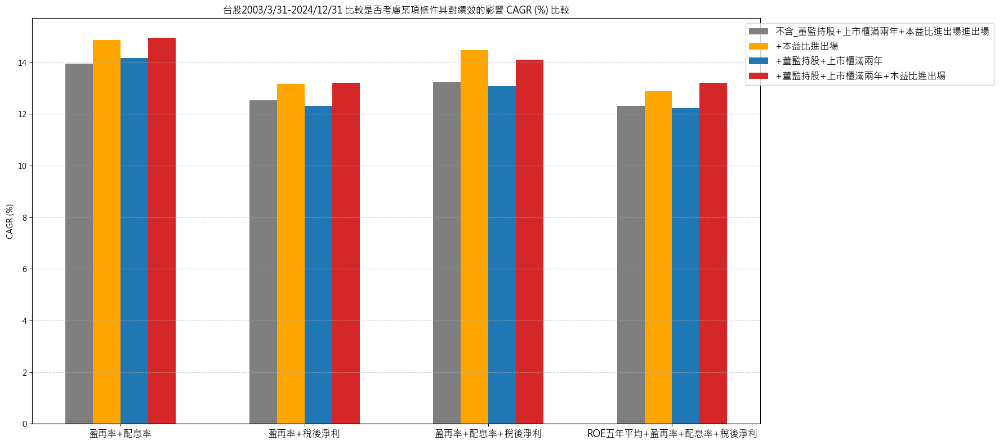

In [57]:
# Clean any leading/trailing spaces in the 'Strategy' column
df['Strategy'] = df['Strategy'].str.strip()

# Extract prefixes and suffixes for categorization
# Ensure the entire strategy is matched correctly
prefix_pattern = r'^(盈再率\+配息率\+稅後淨利|盈再率\+配息率|盈再率\+稅後淨利|ROE五年平均\+盈再率\+配息率\+稅後淨利)'
suffix_pattern = r'(\+董監持股\+上市櫃滿兩年_本益比|\+董監持股\+上市櫃滿兩年|_本益比)$'
df['Prefix'] = df['Strategy'].str.extract(prefix_pattern)
df['Suffix'] = df['Strategy'].str.extract(suffix_pattern)

# Add a category for strategies without any suffix
df['Suffix'] = df['Suffix'].fillna('不含_董監持股+上市櫃滿兩年_本益比進出場')

# Ensure all combinations of Prefix and Suffix are present
prefixes = ['盈再率+配息率', '盈再率+稅後淨利', '盈再率+配息率+稅後淨利', 'ROE五年平均+盈再率+配息率+稅後淨利']
suffixes = ['不含_董監持股+上市櫃滿兩年_本益比進出場', '_本益比', '+董監持股+上市櫃滿兩年', '+董監持股+上市櫃滿兩年_本益比']
all_combinations = pd.MultiIndex.from_product([prefixes, suffixes], names=['Prefix', 'Suffix'])

# Reindex to ensure all combinations exist and fill missing values with NaN
grouped_df = df.groupby(['Prefix', 'Suffix'])['CAGR (%)'].mean().reindex(all_combinations, fill_value=np.nan).unstack()

# Reorder grouped_df columns and index to match the desired order
grouped_df = grouped_df.loc[prefixes, suffixes]

# Validate grouped_df for missing data
print("Grouped DataFrame:")
print(grouped_df)

# Define bar positions and width
x = np.arange(len(grouped_df))  # Number of prefix groups
width = 0.15  # Width of each bar

# Define suffix colors
suffix_colors = {
    '不含_董監持股+上市櫃滿兩年_本益比進出場': 'tab:gray',
    '_本益比': 'orange',
    '+董監持股+上市櫃滿兩年': 'tab:blue',
    '+董監持股+上市櫃滿兩年_本益比': 'tab:red'
}

# Create the plot
fig, ax = plt.subplots(figsize=(18, 8))

# Plot each suffix category
for i, suffix in enumerate(grouped_df.columns):
    ax.bar(
        x + i * width,
        grouped_df[suffix].fillna(0),  # Replace NaN with 0 for plotting
        width=width,
        label=suffix.replace('_本益比', '+本益比進出場'),  # Escape underscores for legend display
        color=suffix_colors.get(suffix, 'gray')
    )

# Add labels, title, and legend
ax.set_xticks(x + width * (len(grouped_df.columns) - 1) / 2)
ax.set_xticklabels(grouped_df.index, rotation=0, ha='center', fontsize=12)
ax.set_ylabel('CAGR (%)')
ax.set_title('台股2003/3/31-2024/12/31 比較是否考慮某項條件其對績效的影響 CAGR (%) 比較')
ax.legend(loc='upper center', bbox_to_anchor=(1.15, 1), fontsize=12)

# Show the plot
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.show()

Grouped DataFrame:
Suffix                不含董監持股+上市櫃滿兩年&本益比進出場   _本益比  +董監持股+上市櫃滿兩年  \
Prefix                                                            
盈再率+配息率                             352.32 222.47        281.16   
盈再率+稅後淨利                            197.10 140.92        138.18   
盈再率+配息率+稅後淨利                        138.09  96.10        100.03   
ROE五年平均+盈再率+配息率+稅後淨利                 76.09  50.83         56.11   

Suffix                +董監持股+上市櫃滿兩年_本益比  
Prefix                                  
盈再率+配息率                         172.71  
盈再率+稅後淨利                         93.54  
盈再率+配息率+稅後淨利                     65.61  
ROE五年平均+盈再率+配息率+稅後淨利             35.48  


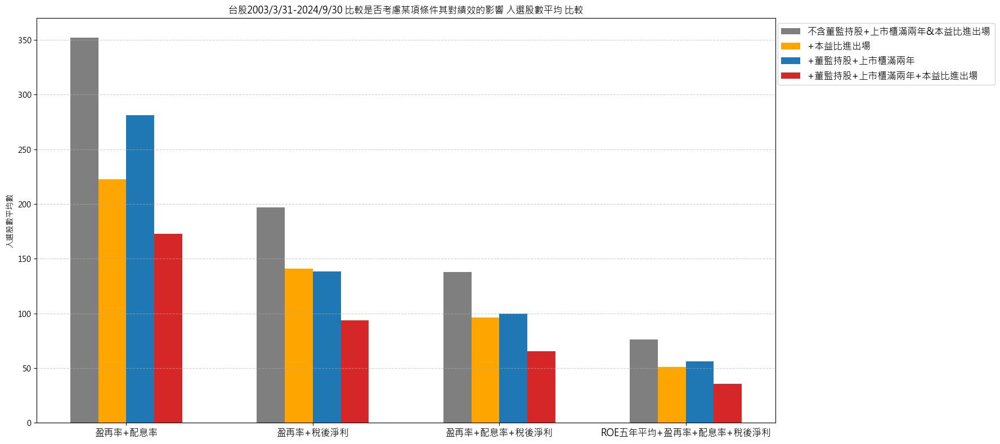

In [58]:
# Clean any leading/trailing spaces in the 'Strategy' column
df['Strategy'] = df['Strategy'].str.strip()

# Extract prefixes and suffixes for categorization
# Ensure the entire strategy is matched correctly
prefix_pattern = r'^(盈再率\+配息率\+稅後淨利|盈再率\+配息率|盈再率\+稅後淨利|ROE五年平均\+盈再率\+配息率\+稅後淨利)'
suffix_pattern = r'(\+董監持股\+上市櫃滿兩年_本益比|\+董監持股\+上市櫃滿兩年|_本益比)$'
df['Prefix'] = df['Strategy'].str.extract(prefix_pattern)
df['Suffix'] = df['Strategy'].str.extract(suffix_pattern)

# Add a category for strategies without any suffix
df['Suffix'] = df['Suffix'].fillna('不含董監持股+上市櫃滿兩年&本益比進出場')

# Ensure all combinations of Prefix and Suffix are present
prefixes = ['盈再率+配息率', '盈再率+稅後淨利', '盈再率+配息率+稅後淨利', 'ROE五年平均+盈再率+配息率+稅後淨利']
suffixes = ['不含董監持股+上市櫃滿兩年&本益比進出場', '_本益比', '+董監持股+上市櫃滿兩年', '+董監持股+上市櫃滿兩年_本益比']
all_combinations = pd.MultiIndex.from_product([prefixes, suffixes], names=['Prefix', 'Suffix'])

# Reindex to ensure all combinations exist and fill missing values with NaN
grouped_df = df.groupby(['Prefix', 'Suffix'])['入選股數平均'].mean().reindex(all_combinations, fill_value=np.nan).unstack()

# Reorder grouped_df columns and index to match the desired order
grouped_df = grouped_df.loc[prefixes, suffixes]

# Validate grouped_df for missing data
print("Grouped DataFrame:")
print(grouped_df)

# Define bar positions and width
x = np.arange(len(grouped_df))  # Number of prefix groups
width = 0.15  # Width of each bar

# Define suffix colors
suffix_colors = {
    '不含董監持股+上市櫃滿兩年&本益比進出場': 'tab:gray',
    '_本益比': 'orange',
    '+董監持股+上市櫃滿兩年': 'tab:blue',
    '+董監持股+上市櫃滿兩年_本益比': 'tab:red'
}

# Create the plot
fig, ax = plt.subplots(figsize=(18, 8))

# Plot each suffix category
for i, suffix in enumerate(grouped_df.columns):
    ax.bar(
        x + i * width,
        grouped_df[suffix].fillna(0),  # Replace NaN with 0 for plotting
        width=width,
        label=suffix.replace('_本益比', '+本益比進出場'),  # Escape underscores for legend display
        color=suffix_colors.get(suffix, 'gray')
    )

# Add labels, title, and legend
ax.set_xticks(x + width * (len(grouped_df.columns) - 1) / 2)
ax.set_xticklabels(grouped_df.index, rotation=0, ha='center', fontsize=12)
ax.set_ylabel('入選股數平均數')
ax.set_title('台股2003/3/31-2024/9/30 比較是否考慮某項條件其對績效的影響 入選股數平均 比較')
ax.legend(loc='upper center', bbox_to_anchor=(1.15, 1), fontsize=12)

# Show the plot
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.show()

---

## 調整財務比率篩選標準

### 進出場條件
- 當年度ROE<15%出場
- 本益比進出場

In [59]:
# orig_all_opt_pe_roe = (orig_all_cond & pe_cond_entry_daily[START_DATE:END_DATE]).hold_until((~orig_all_cond[START_DATE:END_DATE]) | pe_cond_exit_daily[START_DATE:END_DATE] | (roe[START_DATE:END_DATE] < 15))

pe_entry_test_dic = {}

for p in range(8, 15, 2):
    pe_entry_test = daily_pe.resample('ME').last() < p
    pe_entry_test_dic[f'原始條件_本益比小於{p}進場'] = (orig_all_cond & pe_entry_test[START_DATE:END_DATE]).hold_until((~orig_all_cond[START_DATE:END_DATE]) | pe_cond_exit_daily[START_DATE:END_DATE])

pe_entry_test_comb = sim_conditions(pe_entry_test_dic, resample="ME", data=data)
pe_entry_test_comb.selected_stock_count_analysis()

Backtesting progress: 100%|██████████| 4/4 [00:13<00:00,  3.49s/condition]


,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
原始條件_本益比小於12進場,13.21,-55.38,35.48,36.00,29.25,43.00,2.00,63.00
原始條件_本益比小於14進場,13.00,-54.47,40.34,42.00,37.00,48.00,3.00,72.00
原始條件_本益比小於10進場,12.23,-55.61,25.81,24.00,19.00,33.00,1.00,57.00
原始條件_本益比小於8進場,10.50,-57.86,16.45,13.00,9.00,22.00,3.00,39.00


### ROE

In [60]:
roe_value_cond = {}
no_roe_conds = (rr_cond & profit_cond & hold_cond & listed & payout_ratio_cond)[START_DATE:END_DATE]

for i in range(10, 26, 5): # 大於 10~25%
    for n in range(3, 6): # 3, 4, 5年平均
        
        roe_rolling = roe.rolling(n).mean()
        roe_cond_opt = (roe_rolling > i)[START_DATE:END_DATE]

        roe_value_cond[f'roe_{n}y_{i}_無本益比進出場'] = (roe_cond_opt & no_roe_conds)[START_DATE:END_DATE]
        roe_value_cond[f'roe_{n}y_{i}_有本益比進出場'] = ((roe_cond_opt &  no_roe_conds & pe_cond_entry_daily[START_DATE:END_DATE]).hold_until((~(roe_cond_opt &  no_roe_conds)) | pe_cond_exit_daily[START_DATE:END_DATE]))
        
roe_collection = sim_conditions(roe_value_cond, resample='ME', data=data)
roe_collection.selected_stock_count_analysis()

Backtesting progress: 100%|██████████| 24/24 [01:02<00:00,  2.62s/condition]


,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
roe_4y_15_有本益比進出場,13.72,-56.15,35.26,37.00,30.00,41.00,1.00,66.00
roe_3y_10_有本益比進出場,13.58,-53.55,55.94,57.00,45.00,68.00,4.00,113.00
roe_4y_10_有本益比進出場,13.41,-53.99,56.00,58.50,45.00,70.00,4.00,107.00
roe_5y_10_有本益比進出場,13.38,-54.38,55.37,58.00,44.50,69.75,4.00,104.00
roe_5y_15_有本益比進出場,13.21,-55.38,35.48,36.00,29.25,43.00,2.00,63.00
roe_3y_10_無本益比進出場,12.74,-53.60,82.18,80.00,65.00,110.75,6.00,160.00
roe_3y_15_有本益比進出場,12.72,-56.78,35.76,37.00,32.00,42.00,2.00,69.00
roe_4y_15_無本益比進出場,12.72,-55.20,55.82,56.00,51.00,71.00,2.00,104.00
roe_5y_10_無本益比進出場,12.53,-53.55,80.97,82.00,64.00,110.00,6.00,153.00


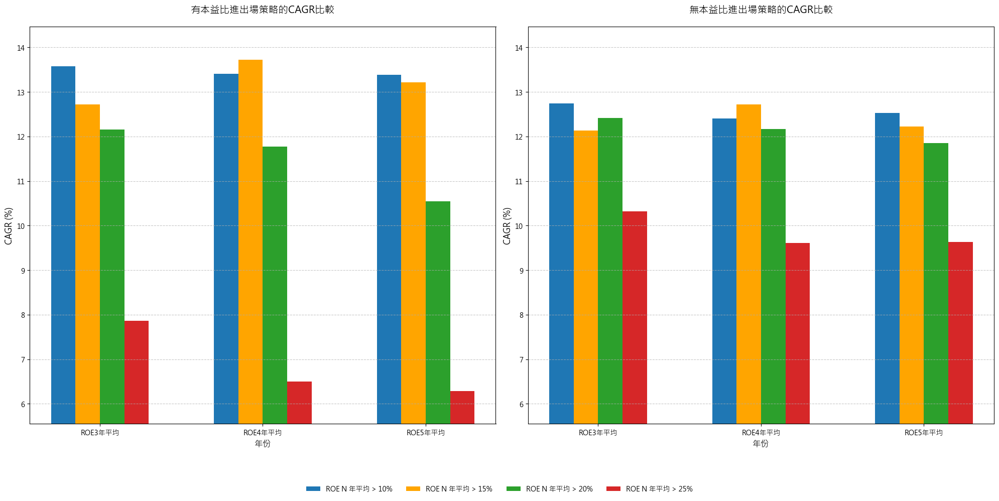

In [61]:
roe_collection_df = roe_collection.selected_stock_count_analysis()
roe_collection_df.reset_index(inplace=True)


# 建立顏色映射
colors = {
    '10': 'tab:blue',  # 藍色
    '15': 'orange',  # 綠色
    '20': 'tab:green',  # 橘色
    '25': 'tab:red'   # 紅色
}

# 提取年份和ROE閾值
roe_collection_df['Year'] = roe_collection_df['Strategy'].str.extract(r'roe_(\d)y')
roe_collection_df['ROE'] = roe_collection_df['Strategy'].str.extract(r'_(\d+)_')
roe_collection_df['PE'] = roe_collection_df['Strategy'].str.contains('有本益比')

# 創建子圖，設定比例為1:2，並留出下方空間給legend
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

# 獲取唯一的年份值
years = sorted(roe_collection_df['Year'].unique())

# 設定長條的寬度
bar_width = 0.15

# 計算每個年份組的位置
positions = np.arange(len(years))

# 儲存所有CAGR值用於設定y軸範圍
all_cagr_values = []

# 繪製有本益比的長條圖
bars = []  # 儲存長條物件用於之後設定legend
for i, roe_value in enumerate(['10', '15', '20', '25']):
    mask_with_pe = (roe_collection_df['ROE'] == roe_value) & (roe_collection_df['PE'])
    data_with_pe = [roe_collection_df[mask_with_pe & (roe_collection_df['Year'] == year)]['CAGR (%)'].values[0] 
                    if len(roe_collection_df[mask_with_pe & (roe_collection_df['Year'] == year)]) > 0 else 0 
                    for year in years]
    all_cagr_values.extend(data_with_pe)
    
    # 計算長條的位置
    x = positions + (i - 1.5) * bar_width

    # 繪製長條
    bar = ax1.bar(x, data_with_pe, bar_width, label=f'ROE {roe_value}%', color=colors[roe_value])
    bars.append(bar)

# 繪製無本益比的長條圖
for i, roe_value in enumerate(['10', '15', '20', '25']):
    mask_without_pe = (roe_collection_df['ROE'] == roe_value) & (~roe_collection_df['PE'])
    data_without_pe = [roe_collection_df[mask_without_pe & (roe_collection_df['Year'] == year)]['CAGR (%)'].values[0] 
                      if len(roe_collection_df[mask_without_pe & (roe_collection_df['Year'] == year)]) > 0 else 0 
                      for year in years]
    all_cagr_values.extend(data_without_pe)
    
    # 計算長條的位置
    x = positions + (i - 1.5) * bar_width

    # 繪製長條
    ax2.bar(x, data_without_pe, bar_width, color=colors[roe_value])

# 計算y軸範圍
y_min = min(all_cagr_values)
y_max = max(all_cagr_values)
y_margin = (y_max - y_min) * 0.1

# 設定兩個子圖的共同y軸範圍
ax1.set_ylim(y_min - y_margin, y_max + y_margin)
ax2.set_ylim(y_min - y_margin, y_max + y_margin)

# 設定左方子圖（有本益比）
ax1.set_xticks(positions)
ax1.set_xticklabels([f'ROE{year}年平均' for year in years])
ax1.set_title('有本益比進出場策略的CAGR比較', fontsize=14, pad=20)
ax1.set_xlabel('年份', fontsize=12)
ax1.set_ylabel('CAGR (%)', fontsize=12)

# 設定右方子圖（無本益比）
ax2.set_xticks(positions)
ax2.set_xticklabels([f'ROE{year}年平均' for year in years])
ax2.set_title('無本益比進出場策略的CAGR比較', fontsize=14, pad=20)
ax2.set_xlabel('年份', fontsize=12)
ax2.set_ylabel('CAGR (%)', fontsize=12)

# 調整版面配置
plt.tight_layout()

ax1.grid(axis='y', linestyle='--', alpha=0.7)
ax2.grid(axis='y', linestyle='--', alpha=0.7)

# 在兩圖中間下方添加legend
legend = fig.legend(bars, [f'ROE N 年平均 > {roe_value}%' for roe_value in ['10', '15', '20', '25']], 
                   loc='center', bbox_to_anchor=(0.5, 0.02),
                   ncol=4, frameon=False)

# 調整子圖之間的間距和底部空間
plt.subplots_adjust(bottom=0.15)  # 為legend留出空間

# 顯示圖表
plt.show()

In [62]:
roe_collection_df

,Strategy,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max,Year,ROE,PE
0,roe_4y_15_有本益比進出場,13.72,-56.15,35.26,37.00,30.00,41.00,1.00,66.00,4,15,True
1,roe_3y_10_有本益比進出場,13.58,-53.55,55.94,57.00,45.00,68.00,4.00,113.00,3,10,True
2,roe_4y_10_有本益比進出場,13.41,-53.99,56.00,58.50,45.00,70.00,4.00,107.00,4,10,True
3,roe_5y_10_有本益比進出場,13.38,-54.38,55.37,58.00,44.50,69.75,4.00,104.00,5,10,True
4,roe_5y_15_有本益比進出場,13.21,-55.38,35.48,36.00,29.25,43.00,2.00,63.00,5,15,True
5,roe_3y_10_無本益比進出場,12.74,-53.60,82.18,80.00,65.00,110.75,6.00,160.00,3,10,False
6,roe_3y_15_有本益比進出場,12.72,-56.78,35.76,37.00,32.00,42.00,2.00,69.00,3,15,True
7,roe_4y_15_無本益比進出場,12.72,-55.20,55.82,56.00,51.00,71.00,2.00,104.00,4,15,False
8,roe_5y_10_無本益比進出場,12.53,-53.55,80.97,82.00,64.00,110.00,6.00,153.00,5,10,False
9,roe_3y_20_無本益比進出場,12.41,-55.06,33.50,35.00,28.00,39.00,1.00,71.00,3,20,False


### 配息率

In [63]:
payout_strat_opt={}

payout_base_opt_conds = (roe_15 & rr_cond & profit_cond & hold_cond & listed)[START_DATE:END_DATE]

for j in range(0, 86, 5):

    dpr_cond_opt = (payout_ratio.rolling(3).min() >= j)[START_DATE:END_DATE]

    payout_all_opt_conds = payout_base_opt_conds & dpr_cond_opt


    payout_strat_opt[f'原始條件_配息_{j}_2003~2024'] = (payout_all_opt_conds & pe_cond_entry_daily[START_DATE:END_DATE]).hold_until(~payout_all_opt_conds | pe_cond_exit_daily[START_DATE:END_DATE])

payout_strat_opt_comb = sim_conditions(payout_strat_opt, resample='ME', data=data)
payout_strat_opt_comb.selected_stock_count_analysis()

Backtesting progress: 100%|██████████| 18/18 [00:57<00:00,  3.19s/condition]


,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
原始條件_配息_20_2003~2024,14.14,-55.89,41.80,42.00,35.00,50.00,3.00,73.00
原始條件_配息_30_2003~2024,13.86,-55.07,40.05,41.00,33.25,48.00,2.00,72.00
原始條件_配息_25_2003~2024,13.75,-55.96,41.05,41.00,35.00,48.00,2.00,73.00
原始條件_配息_75_2003~2024,13.67,-59.97,7.12,7.00,5.00,10.00,1.00,14.00
原始條件_配息_70_2003~2024,13.65,-52.20,11.77,12.00,8.00,15.00,2.00,21.00
原始條件_配息_45_2003~2024,13.47,-55.42,32.90,35.00,28.00,41.00,1.00,58.00
原始條件_配息_35_2003~2024,13.47,-55.70,38.02,39.00,31.25,46.00,2.00,69.00
原始條件_配息_40_2003~2024,13.21,-55.38,35.48,36.00,29.25,43.00,2.00,63.00
原始條件_配息_15_2003~2024,13.17,-55.89,42.84,44.00,36.00,51.00,4.00,73.00


In [64]:
payout_strat_opt_comb.reports['原始條件_配息_70_2003~2024'].display()

,annualized_rate_of_return,sharpe,max_drawdown,win_ratio
,13.65%,20.89,-52.2%,66.67%


,entry_date,exit_date,entry_sig_date,exit_sig_date,position,period,entry_index,exit_index,return,mae,gmfe,bmfe,mdd,pdays,weight,next_weights
stock_id,,,,,,,,,,,,,,,,
1232,2010-05-03,NaT,2010-04-30,NaT,0.17,3603,2582,-1,6.77,-0.04,7.30,0.00,-0.29,3565.00,0.08,0.08
1537,2018-12-03,NaT,2018-11-30,NaT,0.05,1479,4706,-1,0.54,-0.15,0.63,0.16,-0.27,1445.00,0.08,0.08
2373,2018-04-02,NaT,2018-03-31,NaT,0.08,1647,4538,-1,0.08,-0.03,0.34,0.00,-0.21,1617.00,0.08,0.08
2385,2019-06-03,NaT,2019-05-31,NaT,0.06,1362,4823,-1,1.92,-0.04,3.78,0.37,-0.42,1358.00,0.08,0.08
2420,2023-04-06,NaT,2023-03-31,NaT,0.05,427,5758,-1,0.67,-0.01,1.03,0.03,-0.22,425.00,0.08,0.08
3014,2023-04-06,NaT,2023-03-31,NaT,0.05,427,5758,-1,0.82,-0.04,1.13,0.02,-0.25,410.00,0.08,0.08
3078,2024-05-02,NaT,2024-04-30,NaT,0.08,166,6019,-1,-0.02,-0.20,0.01,0.01,-0.20,9.00,0.08,0.08
4105,2018-12-03,NaT,2018-11-30,NaT,0.05,1479,4706,-1,0.18,-0.27,0.35,0.11,-0.34,1006.00,0.08,0.08
4137,2020-02-03,NaT,2020-01-31,NaT,0.06,1201,4984,-1,-0.23,-0.24,0.55,0.55,-0.51,1066.00,0.08,0.08


In [65]:
_,_=payout_strat_opt_comb.reports['原始條件_配息_40_2003~2024'].calc_returns_contrib(5)

In [66]:
_,_=payout_strat_opt_comb.reports['原始條件_配息_70_2003~2024'].calc_returns_contrib(5)

In [67]:
payout_strat_df = payout_strat_opt_comb.selected_stock_count_analysis()

In [68]:
# reset index
payout_strat_df.reset_index(inplace=True)

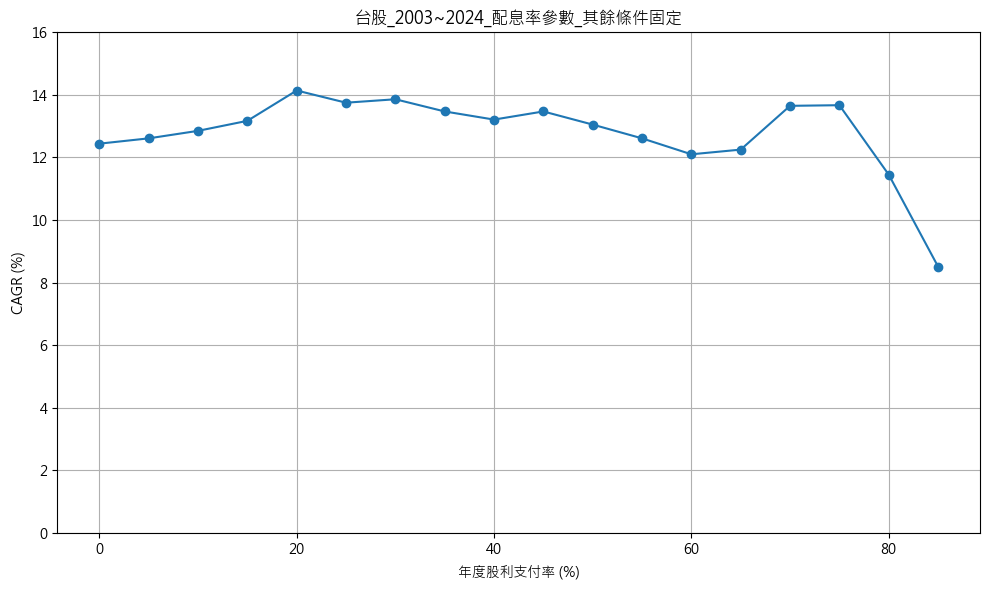

In [69]:
# 從Strategy欄位提取n值
payout_strat_df['n_value'] = payout_strat_df['Strategy'].str.extract(r'配息_(\d+)_').astype(int)

# 按n_value排序
payout_strat_df.sort_values(by='n_value', inplace=True)

# 建立折線圖
plt.figure(figsize=(10, 6))
plt.plot(payout_strat_df['n_value'], payout_strat_df['CAGR (%)'], marker='o')

plt.ylim(0, 16)

# 設定圖表樣式
plt.title('台股_2003~2024_配息率參數_其餘條件固定')
plt.xlabel('年度股利支付率 (%)')
plt.ylabel('CAGR (%)')
plt.grid(True)

# 顯示圖表
plt.tight_layout()
plt.show()

---

In [70]:
roe_dpr_opt_base_conds = rr_cond & profit_cond & hold_cond & listed

roe_dpr_pe_opt_conds = {}

for i in range(10, 26, 5): # ROE 10~25%
    for n in range(0, 76, 5):  # 配息率 0~75%
        dpr_cond_rr_opt = payout_ratio.rolling(3).min() >= n
        roe_5y_opt = roe.rolling(5).mean() > i
        
        roe_dpr_opt_all_conds = (roe_dpr_opt_base_conds & roe_5y_opt & dpr_cond_rr_opt)[START_DATE:END_DATE]

        roe_dpr_pe_opt_conds[f'ROE5年平均_{i}_配息率_{n}__本益比進出場'] = (roe_dpr_opt_all_conds & pe_cond_entry_daily[START_DATE:END_DATE]).hold_until((~roe_dpr_opt_all_conds) | pe_cond_exit_daily[START_DATE:END_DATE])



roe_dpr_pe_opt_collecs = sim_conditions(roe_dpr_pe_opt_conds, resample='ME', data=data)
roe_dpr_pe_opt_collecs.selected_stock_count_analysis()

Backtesting progress: 100%|██████████| 64/64 [02:45<00:00,  2.59s/condition]


,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
ROE5年平均_10_配息率_70__本益比進出場,14.44,-48.62,17.17,18.00,9.00,23.00,1.00,35.00
ROE5年平均_15_配息率_20__本益比進出場,14.14,-55.89,41.80,42.00,35.00,50.00,3.00,73.00
ROE5年平均_15_配息率_30__本益比進出場,13.86,-55.07,40.05,41.00,33.25,48.00,2.00,72.00
ROE5年平均_15_配息率_25__本益比進出場,13.75,-55.96,41.05,41.00,35.00,48.00,2.00,73.00
ROE5年平均_10_配息率_20__本益比進出場,13.73,-54.75,65.13,65.50,55.25,77.75,5.00,124.00
...,...,...,...,...,...,...,...,...
ROE5年平均_25_配息率_50__本益比進出場,6.46,-62.53,7.43,7.00,5.00,10.00,3.00,17.00
ROE5年平均_25_配息率_40__本益比進出場,6.29,-62.27,9.75,9.00,5.00,13.00,3.00,21.00
ROE5年平均_25_配息率_60__本益比進出場,6.05,-62.80,4.96,5.00,3.00,6.00,0.00,12.00


In [71]:
roe_dpr_pe_opt_df = roe_dpr_pe_opt_collecs.selected_stock_count_analysis()
roe_dpr_pe_opt_df.reset_index(inplace=True)

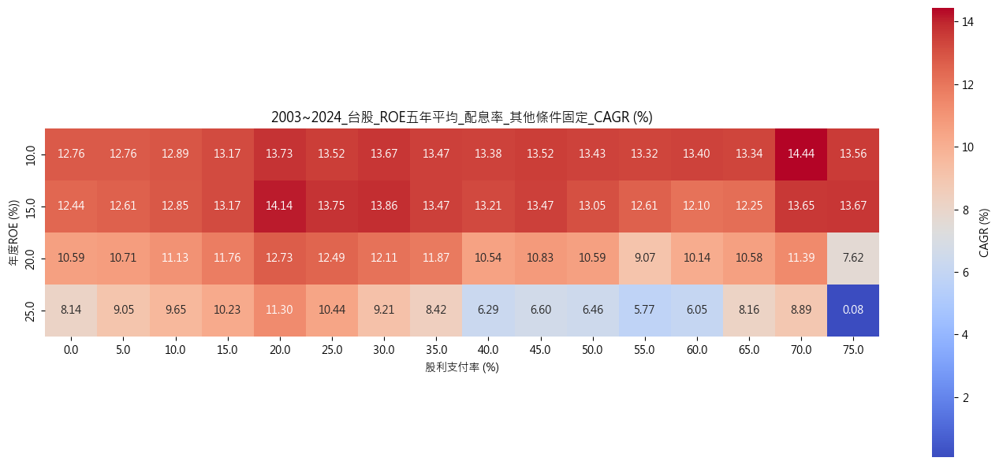

In [72]:
# 從Strategy欄位中提取盈再率和配息率的值
roe_rates = []
dividend_rates = []

for strategy in roe_dpr_pe_opt_df['Strategy']:
    # 分割字串並提取數值
    parts = strategy.split('_')
    roe_rate = float(parts[1])
    dividend_rate = float(parts[3])      # 配息率的值
    
    roe_rates.append(roe_rate)
    dividend_rates.append(dividend_rate)

# 將提取的值添加到DataFrame中
roe_dpr_pe_opt_df['ROE_Rate'] = roe_rates
roe_dpr_pe_opt_df['Dividend_Rate'] = dividend_rates

# 創建樞紐表
pivot_table = roe_dpr_pe_opt_df.pivot(
    index='ROE_Rate',
    columns='Dividend_Rate',
    values='CAGR (%)'
)

# 設置圖形大小
plt.figure(figsize=(14, 6))

# 繪製熱力圖
sns.heatmap(pivot_table, 
            annot=True,           # 顯示數值
            fmt='.2f',            # 數值格式化為兩位小數
            cmap='coolwarm',      # 使用紅黃藍色階，_r表示顏色反轉
            cbar_kws={'label': 'CAGR (%)'},  # 設置色階標籤
            square=True           # 確保每個單元格都是正方形
)

# 設置標題和軸標籤
plt.title('2003~2024_台股_ROE五年平均_配息率_其他條件固定_CAGR (%)')
plt.xlabel('股利支付率 (%)')
plt.ylabel('年度ROE (%))')

# 調整布局
plt.tight_layout()

# 顯示圖形
plt.show()

In [73]:
rr_dpr_opt_base_conds = roe_15 & profit_cond & hold_cond & listed

rr_dpr_pe_opt_conds = {}

for i in range(0, 76, 5): 
    for n in [0, 0.2, 0.4, 0.6, 0.8]:
        dpr_cond_rr_opt = payout_ratio.rolling(3).min() >= i
        rr_dpr_opt_all_conds = (rr_dpr_opt_base_conds & (rr < n) & dpr_cond_rr_opt)[START_DATE:END_DATE]

        rr_dpr_pe_opt_conds[f'盈再率_{n}_配息率_{i}_本益比進出場'] = (rr_dpr_opt_all_conds & pe_cond_entry_daily[START_DATE:END_DATE]).hold_until((~rr_dpr_opt_all_conds) | pe_cond_exit_daily[START_DATE:END_DATE])



rr_dpr_pe_opt_collecs = sim_conditions(rr_dpr_pe_opt_conds, resample='ME', data=data)
rr_dpr_pe_opt_collecs.selected_stock_count_analysis()

Backtesting progress: 100%|██████████| 80/80 [02:46<00:00,  2.08s/condition]


,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
盈再率_0_配息率_50_本益比進出場,15.70,-61.01,6.89,6.00,5.00,10.00,1.00,13.00
盈再率_0_配息率_30_本益比進出場,15.42,-61.77,8.80,9.00,6.00,11.00,1.00,14.00
盈再率_0_配息率_45_本益比進出場,15.17,-60.68,7.71,8.00,5.00,10.00,1.00,13.00
盈再率_0_配息率_70_本益比進出場,15.10,-60.42,3.94,4.00,3.00,4.00,1.00,10.00
盈再率_0_配息率_25_本益比進出場,15.04,-61.77,9.00,9.00,6.00,12.00,1.00,14.00
...,...,...,...,...,...,...,...,...
盈再率_0.6_配息率_60_本益比進出場,11.94,-55.51,22.91,23.00,18.00,28.00,4.00,44.00
盈再率_0_配息率_60_本益比進出場,11.83,-60.50,5.31,5.00,3.00,7.00,1.00,11.00
盈再率_0.2_配息率_55_本益比進出場,11.64,-58.66,17.40,16.50,14.00,22.00,2.00,33.00


In [74]:
rr_dpr_pe_opt_df = rr_dpr_pe_opt_collecs.selected_stock_count_analysis()
rr_dpr_pe_opt_df.reset_index(inplace=True)

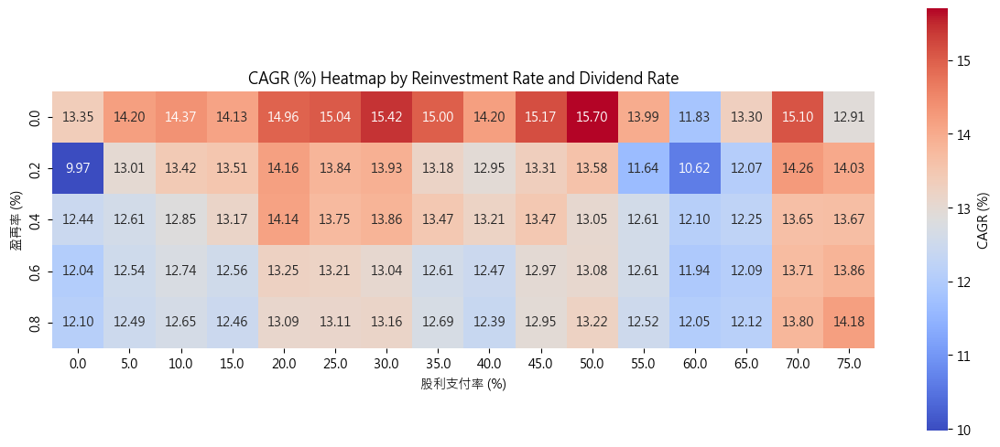

In [75]:
# 從Strategy欄位中提取盈再率和配息率的值
reinvestment_rates = []
dividend_rates = []

for strategy in rr_dpr_pe_opt_df['Strategy']:
    # 分割字串並提取數值
    parts = strategy.split('_')
    reinvestment_rate = float(parts[1])  # 盈再率的值
    dividend_rate = float(parts[3])      # 配息率的值
    
    reinvestment_rates.append(reinvestment_rate)
    dividend_rates.append(dividend_rate)

# 將提取的值添加到DataFrame中
rr_dpr_pe_opt_df['Reinvestment_Rate'] = reinvestment_rates
rr_dpr_pe_opt_df['Dividend_Rate'] = dividend_rates

# 創建樞紐表
pivot_table = rr_dpr_pe_opt_df.pivot(
    index='Reinvestment_Rate',
    columns='Dividend_Rate',
    values='CAGR (%)'
)

# 設置圖形大小
plt.figure(figsize=(12, 5))

# 繪製熱力圖
sns.heatmap(pivot_table, 
            annot=True,           # 顯示數值
            fmt='.2f',            # 數值格式化為兩位小數
            cmap='coolwarm',      # 使用紅黃藍色階，_r表示顏色反轉
            cbar_kws={'label': 'CAGR (%)'},  # 設置色階標籤
            square=True
)

# 設置標題和軸標籤
plt.title('CAGR (%) Heatmap by Reinvestment Rate and Dividend Rate')
plt.xlabel('股利支付率 (%)')
plt.ylabel('盈再率 (%)')

# 調整布局
plt.tight_layout()

# 顯示圖形
plt.show()